<a href="https://colab.research.google.com/github/YannickLy/NLP-Project-ENSAE-2020/blob/master/Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 # <center> PROJET NLP ENSAE 2020 - TOXIC COMMENT CLASSIFICATION </center> 
<center> Eléonore BLANCHARD, Yannick LY </center>

---

## <u> **Description du sujet** </u>

<h5 align='justify'>Avec la forte montée des réseaux sociaux et de par l'anonymat d'internet, nous observons une hausse de commentaires toxiques et du harcèlement en ligne. Certains d'entre eux étant même illégaux du fait de leur caractère raciste, homophobe, pédophile, etc. C'est pourquoi il est important que les plateformes en ligne modèrent ce type de commentaires et appliquent des sanctions comme le bannissement de la plateforme ou encore transmission de l'adresse IP aux autorités compétentes. Cependant les plateformes en ligne ont encore du mal à identifier correctement ces commentaires notamment son type de toxicité (toxique, très toxique, obscène, menace, insulte, haine identitaire). Pouvoir identifier le type de toxicité permettrait alors de pouvoir appliquer des mesures adéquates. Nous cherchons alors à construire un modèle multi-label permettant de détecter le type ou les types de toxicité. Nous utiliserons un data set issu de commentaires provenant de Wikipédia.</h5>







##  **<u>0 - Introduction</u>** 

<h5 align='justify'>Dans cette partie introductive, nous allons importer les librairies nécessaires au projet, télécharger nos données et effectuer une présentation de nos données. </h5>

In [0]:
# System
import warnings
import time
from multiprocessing import cpu_count
warnings.filterwarnings('ignore')

# Basics
import numpy as np
import pandas as pd

# Visualization 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from wordcloud import WordCloud, STOPWORDS
import plotly.graph_objects as go

# Tokenization and cleaning
import spacy
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import TreebankWordTokenizer, ToktokTokenizer, TweetTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
import string
from string import punctuation

# Embedding
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec 
from gensim.models import KeyedVectors
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Classification
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, recall_score, precision_score, f1_score
import lightgbm as lgb

# LSTM
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Dense, Input, CuDNNLSTM, Embedding, Dropout, SpatialDropout1D, Bidirectional
from keras.models import Model
from keras.optimizers import Adam
from keras.layers.normalization import BatchNormalization

# Tools
from functools import reduce
from operator import add
from collections import Counter
from scipy import sparse
from scipy.sparse import hstack
import tarfile
from tqdm import tqdm

# Configuration
nltk.download('stopwords')
nltk.download('wordnet')
eng_stopwords = set(stopwords.words('english'))
eng_stopwords.update(['zero','one','two','three','four','five','six','seven','eight','nine','ten','may','also','across','among','beside','however','yet','within'])
lem = WordNetLemmatizer()
APPO = {
"aren't" : "are not",
"can't" : "cannot",
"couldn't" : "could not",
"didn't" : "did not",
"doesn't" : "does not",
"don't" : "do not",
"hadn't" : "had not",
"hasn't" : "has not",
"haven't" : "have not",
"he'd" : "he would",
"he'll" : "he will",
"he's" : "he is",
"i'd" : "I would",
"i'd" : "I had",
"i'll" : "I will",
"i'm" : "I am",
"isn't" : "is not",
"it's" : "it is",
"it'll":"it will",
"i've" : "I have",
"let's" : "let us",
"mightn't" : "might not",
"mustn't" : "must not",
"shan't" : "shall not",
"she'd" : "she would",
"she'll" : "she will",
"she's" : "she is",
"shouldn't" : "should not",
"that's" : "that is",
"there's" : "there is",
"they'd" : "they would",
"they'll" : "they will",
"they're" : "they are",
"they've" : "they have",
"we'd" : "we would",
"we're" : "we are",
"weren't" : "were not",
"we've" : "we have",
"what'll" : "what will",
"what're" : "what are",
"what's" : "what is",
"what've" : "what have",
"where's" : "where is",
"who'd" : "who would",
"who'll" : "who will",
"who're" : "who are",
"who's" : "who is",
"who've" : "who have",
"won't" : "will not",
"wouldn't" : "would not",
"you'd" : "you would",
"you'll" : "you will",
"you're" : "you are",
"you've" : "you have",
"'re": " are",
"wasn't": "was not",
"we'll":" will",
"didn't": "did not",
"tryin'":"trying"
}
cpu = cpu_count()
print('The virtual instance has {} cpus'.format(cpu))
#!pip install tensorflow-gpu==1.15 # on downgrade en 1.15 car certaines fonctionnalités ne sont plus disponibles en 2.X et nous avons besoin de ces fonctionnalités pour lancer le LSTM bidirectionnel
#!pip install tensorflow==1.15

Using TensorFlow backend.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
The virtual instance has 4 cpus


### **<u>0.1 Téléchargement du set de données</u>**

In [0]:
!wget -c https://github.com/YannickLy/NLP-Project-ENSAE-2020/blob/master/Data/Data.zip?raw=true -O Data.zip
!unzip Data.zip

--2020-04-18 23:30:00--  https://github.com/YannickLy/NLP-Project-ENSAE-2020/blob/master/Data/Data.zip?raw=true
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/YannickLy/NLP-Project-ENSAE-2020/raw/master/Data/Data.zip [following]
--2020-04-18 23:30:00--  https://github.com/YannickLy/NLP-Project-ENSAE-2020/raw/master/Data/Data.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/YannickLy/NLP-Project-ENSAE-2020/master/Data/Data.zip [following]
--2020-04-18 23:30:01--  https://raw.githubusercontent.com/YannickLy/NLP-Project-ENSAE-2020/master/Data/Data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.

### **<u>0.2 Description du set de données</u>**


In [0]:
train = pd.read_csv('Data/train.csv')
X_test = pd.read_csv('Data/test.csv')
y_test = pd.read_csv('Data/test_labels.csv')
test = X_test.merge(y_test, on = 'id')
test = test[test['toxic'] != -1]
test.reset_index(inplace = True)
test.drop('index', axis = 1, inplace = True)

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159571 entries, 0 to 159570
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             159571 non-null  object
 1   comment_text   159571 non-null  object
 2   toxic          159571 non-null  int64 
 3   severe_toxic   159571 non-null  int64 
 4   obscene        159571 non-null  int64 
 5   threat         159571 non-null  int64 
 6   insult         159571 non-null  int64 
 7   identity_hate  159571 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 9.7+ MB


Le data set est composé de 8 colonnes :
* `id`: ID unique afin d'identifier le commentaire
* `comment_text` : le texte du commentaire
* `toxic` : le commentaire comporte t-il un caractère toxique ? (1 si oui, 0 si non)
* `severe_toxic` : le commentaire comporte t-il un caractère très toxique ? (1 si oui, 0 si non)
* `obscene` : le commentaire comporte t-il un caractère obscène ? (1 si oui, 0 si non)
* `threat` : le commentaire comporte t-il une menace ? (1 si oui, 0 si non)
* `insult` : le commentaire comporte t-il une insulte ? (1 si oui, 0 si non)
* `identity_hate` : le commentaire comporte t-il un caractère de haine identitaire ? (1 si oui, 0 si non)

Le data set est composé de 159 171 commentaires qui ont été labellisés par des humains, des erreurs de labellisations sont alors possibles. Certains commentaires disposent de plusieurs labels.

Afin de mieux comprendre ce que chaque label (`toxic`, `severe_toxic`, `obscene`,  `threat`, `insult`, `identity_hate`) signifie, nous allons afficher un exemple pour chacun :

<u>Toxic comment :</u>

In [0]:
print(train[(train.toxic==1) & (train.severe_toxic==0) & (train.obscene==0) & (train.threat==0) & (train.insult==0) & (train.identity_hate==0)].iloc[0,1])

Hey... what is it..
@ | talk .
What is it... an exclusive group of some WP TALIBANS...who are good at destroying, self-appointed purist who GANG UP any one who asks them questions abt their ANTI-SOCIAL and DESTRUCTIVE (non)-contribution at WP?

Ask Sityush to clean up his behavior than issue me nonsensical warnings...


<u>Severe toxic comment :</u> 

In [0]:
print(train[(train.toxic==1) & (train.severe_toxic==1) & (train.obscene==0) & (train.threat==0) & (train.insult==0) & (train.identity_hate==0)].iloc[0,1])

so everytime i reset my modem my ip changes

fuck you petty sexless ugly ass desperate no life.. no status in society anal retentive wiki admins

(the site is great.. but the lower level admins have no life and can't handle the little authority they have.. it tells you how small and pathetic their lives are)

if i get blocked ill be on in 20 seconds with a new ip or the pizza is free.

cheers.


<u> Obscene comment : </u>

In [0]:
print(train[(train.toxic==0) & (train.severe_toxic==0) & (train.obscene==1) & (train.threat==0) & (train.insult==0) & (train.identity_hate==0)].iloc[0,1])

How do you know he is dead.  Its just his plane that crashed.  Jeezz, quit busting his nuts, folks.


<u> Threat comment : </u>

In [0]:
print(train[(train.toxic==0) & (train.severe_toxic==0) & (train.obscene==0) & (train.threat==1) & (train.insult==0) & (train.identity_hate==0)].iloc[0,1])

Please stop. If you continue to ignore our policies by introducing inappropriate pages to Wikipedia, you will be blocked.


<u> Insult comment : </u>

In [0]:
print(train[(train.toxic==0) & (train.severe_toxic==0) & (train.obscene==0) & (train.threat==0) & (train.insult==1) & (train.identity_hate==0)].iloc[0,1])

REPLY ABOVE:
That was me, loser. The UN defines Vietnam to be part of Southeast Asia. And far as I know Vietnam is part of ASEAN, and used to be part of French Indochina with Laos and all those shit countries Anyway your culture has always been more influenced by SEA than Han Chinese (as in proper Yangtze Han Chinese, not the fringe indigenous tribes in Guangzhou/Guangxi). 

Just admit that you vietnamese are all a bunch of wannabe crap people. ALL the east asian people I've spoken to thinks of Vietnam as a very integral part of SEA, and we all think you're backward, dirty and speak in a horrible swearing language. Doesn't matter what crap you spout on Wikipedia, won't change the way people in the real world think.


<u> Identity hate comment : </u>

In [0]:
print(train[(train.toxic==0) & (train.severe_toxic==0) & (train.obscene==0) & (train.threat==0) & (train.insult==0) & (train.identity_hate==1)].iloc[0,1])

Mate, sound like you are jewish

Gayness is in the air


## **<u>I - Statistiques exploratoires et analyse des commentaires</u>**

<h5 align='justify'> Cette première partie dite d'Explanatory Data Analysis (EDA) ou Statistiques exploratoires en français, est une première étape indispensable à tout problème de data science. En effet, elle nous permet de comprendre et expliquer nos données, de mieux spécifier notre sujet, et d'anticiper les problèmes potentiels auxquels nous pourrions être confrontés.

De plus, nous avons décidé de ne pas encore tokenizer et nettoyer les commentaires dans cette partie afin d'exploiter toute l'information présente dans les commentaires incluant le nombre de stopwords, le nombre de mots en majuscule, le nombre de ponctuations ect. Nous exploiterons ces données afin de créer de nouvelles variables si elles semblent pertinentes. Ces nouvelles variables compenseront la perte de donnnées lorsque nous appliquerons notre fonction de nettoyage.</h5>

### **<u>I.1 Présentation des données</u>**

In [0]:
nrow = train.shape[0]
nclass = train.shape[1]-2

#### <u>Equilibre des classes</u>

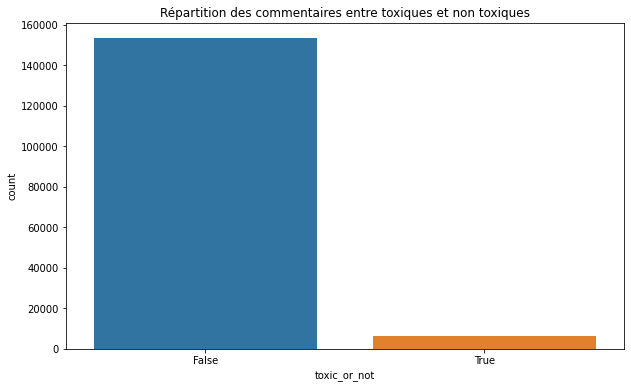

In [0]:
rowsums = train.iloc[:,2:].sum(axis=1)
train['toxic_or_not'] = (rowsums==1) # True si le commentaire est toxique False sinon

plt.figure(figsize=(10,6))
ax = sns.countplot(data = train, x = 'toxic_or_not')
plt.title("Répartition des commentaires entre toxiques et non toxiques")
rects = ax.patches

On remarque qu'il y a beaucoup plus de commentaires non toxiques que toxiques (~150k versus ~16k). Cela pose un premier problème de déséquilibre entre les classes. Il sera important de prendre en compte cette répartition lors du choix de l'algorithme de classification.

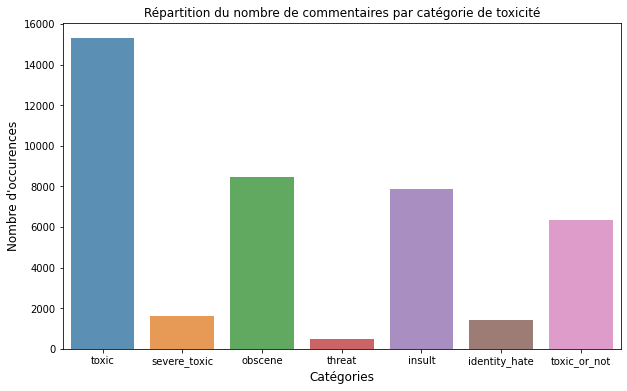

In [0]:
cat = train.iloc[:,2:].sum()

plt.figure(figsize=(10,6))
ax = sns.barplot(cat.index, cat.values, alpha=0.8)
plt.title("Répartition du nombre de commentaires par catégorie de toxicité")
plt.ylabel("Nombre d'occurences", fontsize=12)
plt.xlabel("Catégories", fontsize=12)
rects = ax.patches

Egalement, nous observons un déséquilibre parmi les types de toxicités (par exemple, il y a beaucoup moins de commentaires "threat" ou "severe toxic" que de commentaire "toxic" ou "obscene").

Nous observons enfin qu'il y a ~16k de commentaires toxiques mais que la somme des répartition du nombre de commentaires par catégorie de toxicité s'élève à ~35k, cela est seulement possible lorsqu'un commentaire est assimilé à plusieurs classes.

#### <u>Multi-label classification</u>

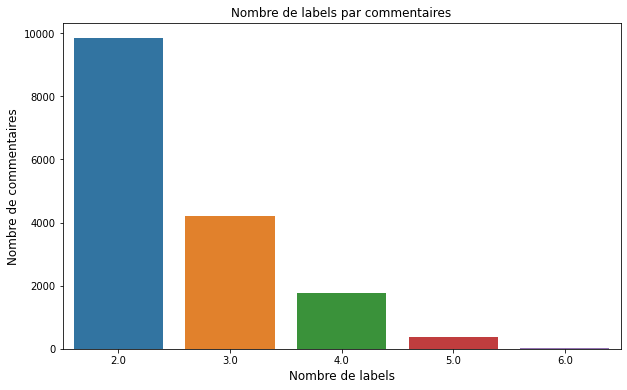

In [0]:
multi_label = train.iloc[:,2:].sum(axis=1).value_counts()

plt.figure(figsize=(10,6))
ax = sns.barplot(multi_label.index[1:], multi_label.values[1:])
plt.title("Nombre de labels par commentaires")
plt.xlabel("Nombre de labels", fontsize=12)
plt.ylabel("Nombre de commentaires", fontsize=12)
rects = ax.patches

On remarque que la plupart des commentaires labelisés ont 1 seul label, il est presque aussi courant de rencontrer des commentaires avec 2 ou 3 labels de toxicité. En revanche, les commentaires ayant plus de 3 labels se font déjà plus rares. Enfin, il y a des commentaires avec les 6 labels. 
Rappelons cependant que les plupart des commentaires sont considérés comme "clean", c'est-à-dire qu'ils ont 0 labels de toxicité.


On peut donc en déduire que la plupart des commentaires auront plusieurs labels, et de ce fait cela complique notre classification car il ne s'agit pas de classifier chaque commentaire comme appartenant à une classe plutôt qu'à une autre car un commentaire peut appartenir à plusieurs classes à la fois. 
Il faudra donc prendre en compte cette caractéristique importante.

### **<u>I.2 Analyse des commmentaires</u>**



In [0]:
features_train = pd.DataFrame()
features_train['toxic_or_not'] = train['toxic_or_not']

#### <u> Impact de la longueur d'un commentaire sur sa toxicité et son type </u>

Dans un premier temps, nous analysons l'impact de la longeur d'un commentaire, à travers le nombre de paragraphes et de mots, tout d'abord pour savoir si le commentaire a une dimension toxique ou non, puis pour déterminer le type de toxicité. 

In [0]:
features_train['count_paraph'] = train["comment_text"].apply(lambda x: len(re.findall("\n",str(x)))+1) 
features_train['count_word']= train["comment_text"].apply(lambda x: len(str(x).split()))
features_train['count_paraph'].loc[features_train['count_paraph']>10] = 10
features_train['count_word'].loc[features_train['count_word']>200] = 200

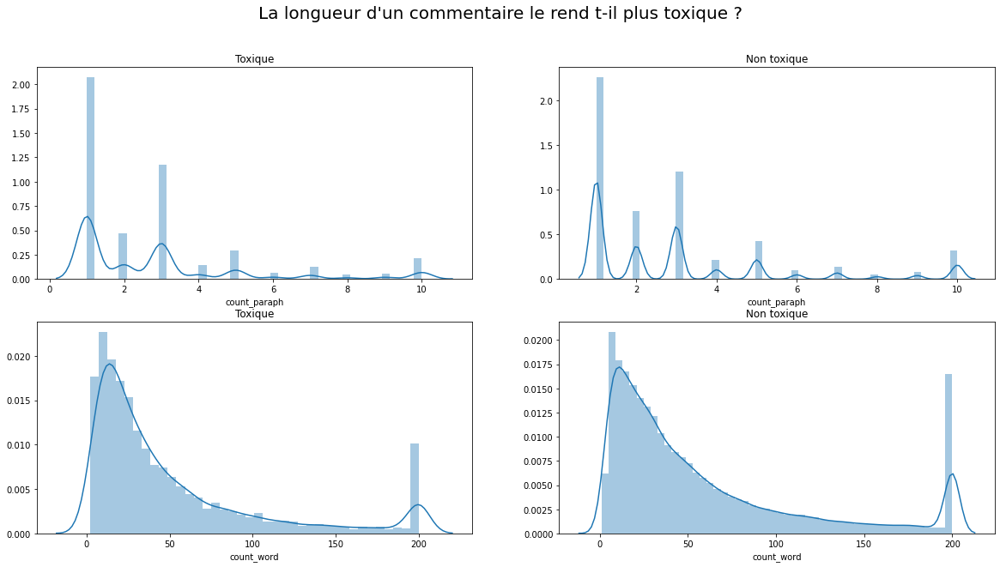

In [0]:
plt.figure(figsize=(20,10))
plt.suptitle("La longueur d'un commentaire le rend t-il plus toxique ?", fontsize = 20)
plt.subplot(221)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['count_paraph'])
plt.subplot(222)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['count_paraph'])
plt.subplot(223)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['count_word'])
plt.subplot(224)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['count_word'])
plt.show()

Nous observons que le nombre de paragraphes n'a pas d'impact significatif sur la toxicité d'un commentaire : qu'il soit toxique ou non, la distribution de la taille des paragraphes est la même.

En ce qui concerne le nombre de mots, la différence est plus marquée. En effet, les commentaires non-toxiques semblent contenir davantage de mots.

On peut donc en déduire que la longueur des commentaires peut nous aider légèrement à déterminer si un commentaire est toxique ou non. Nous allons désormais chercher à savoir si elle nous permet de déterminer le type de toxicité du commentaire.

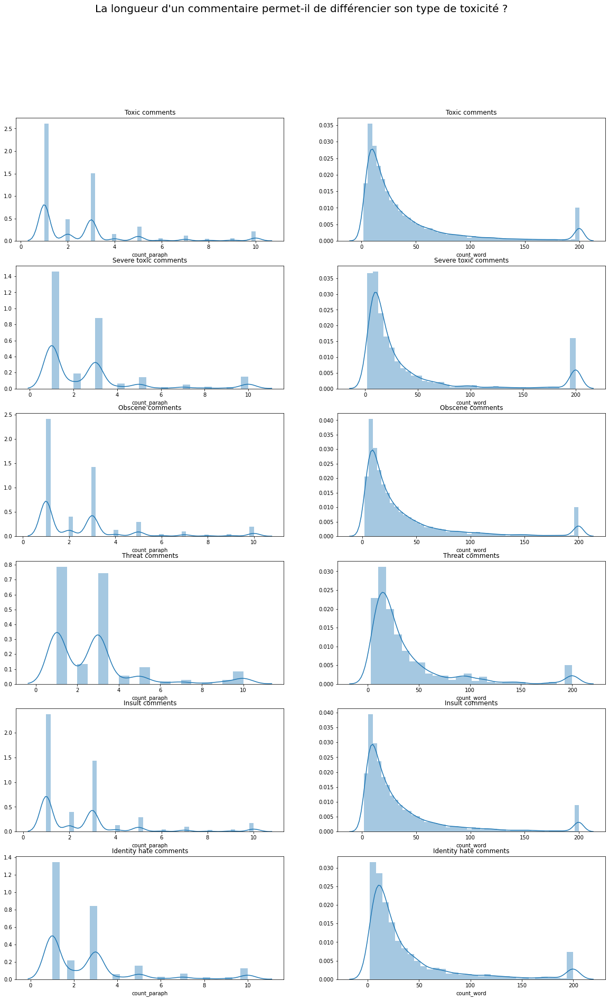

In [0]:
plt.figure(figsize=(20,30))
plt.suptitle("La longueur d'un commentaire permet-il de différencier son type de toxicité ?", fontsize = 20)
plt.subplot(621)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['count_paraph'])
plt.subplot(622)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['count_word'])
plt.subplot(623)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['count_paraph'])
plt.subplot(624)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['count_word'])
plt.subplot(625)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['count_paraph'])
plt.subplot(626)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['count_word'])
plt.subplot(627)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['count_paraph'])
plt.subplot(628)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['count_word'])
plt.subplot(629)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['count_paraph'])
plt.subplot(6,2,10)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['count_word'])
plt.subplot(6,2,11)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['count_paraph'])
plt.subplot(6,2,12)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['count_word'])
plt.show()

Tout comme pour la toxicité, la longueur des commentaires ne nous semble pas significativement influencer le type de toxicité du commentaire. 

En revanche, on peut remarquer des distributions légèrement différentes pour certains types de toxicité, comme les insultes qui ont tendance à être des commentaires plus courts par exemple. 

Nous avons donc décidé de garder les deux variables permettant de qualifier la longueur des commentaires. 

#### <u> Impact de l'aggressivité d'un commentaire sur sa toxicité et son type </u>

Nous allons désormais analyser l'impact de l'agressivité des commentaires, qualifiée par le nombre de ponctuations et de mots en majuscule, sur la toxicité et le type de toxicité des commentaires.

In [0]:
features_train['count_punctuations'] = train["comment_text"].apply(lambda x: len([c for c in str(x) if c in string.punctuation])) # on compte le nombre de ponctuations dans un commentaire
features_train['count_words_upper'] = train["comment_text"].apply(lambda x: len([w for w in str(x).split() if w.isupper()])) # on compte le nombre de mots en majuscule dans un commentaire
features_train['propor_punctuations'] = features_train['count_punctuations'] / features_train['count_word'] 
features_train['propor_words_upper'] = features_train['count_words_upper'] / features_train['count_word']
features_train['propor_punctuations'].loc[features_train['propor_punctuations']>2] = 2
features_train['propor_words_upper'].loc[features_train['propor_words_upper']>1] = 1

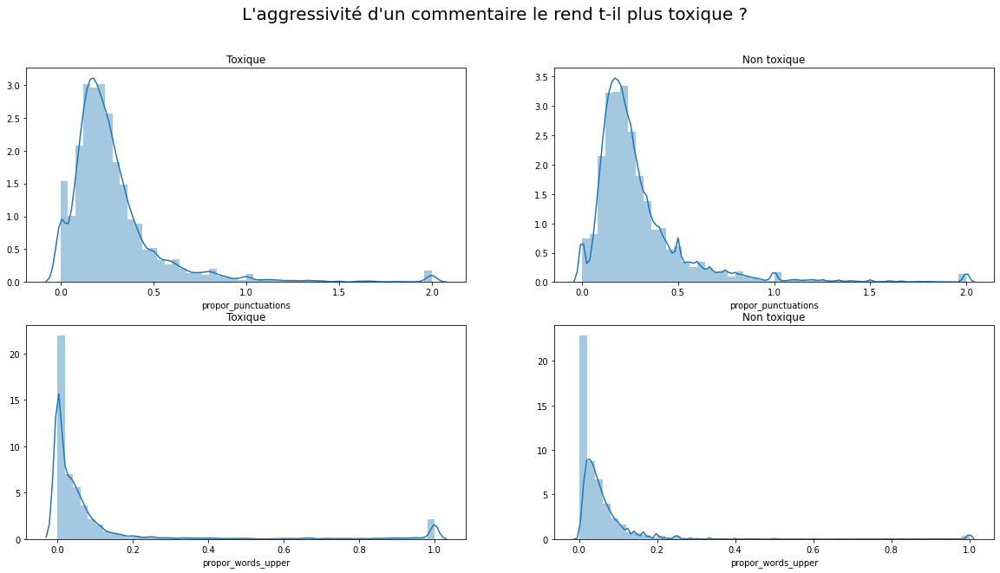

In [0]:
plt.figure(figsize=(20,10))
plt.suptitle("L'aggressivité d'un commentaire le rend t-il plus toxique ?", fontsize = 20)
plt.subplot(221)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['propor_punctuations'])
plt.subplot(222)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['propor_punctuations'])
plt.subplot(223)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['propor_words_upper'])
plt.subplot(224)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['propor_words_upper'])
plt.show()

Nous observons que la proportion de ponctuations parmi le nombre de mots utilisés a un faible impact sur la toxicité du commentaire. 

En revanche, même si la distribution de la proportion de mots en majuscule nous semble relativement similaire pour les commentaires toxiques et non-toxiques, on remarque que les commentaires comportant uniquement des mots en majuscule (proportion de mots en majuscule égale à 1) sont généralement toxiques.

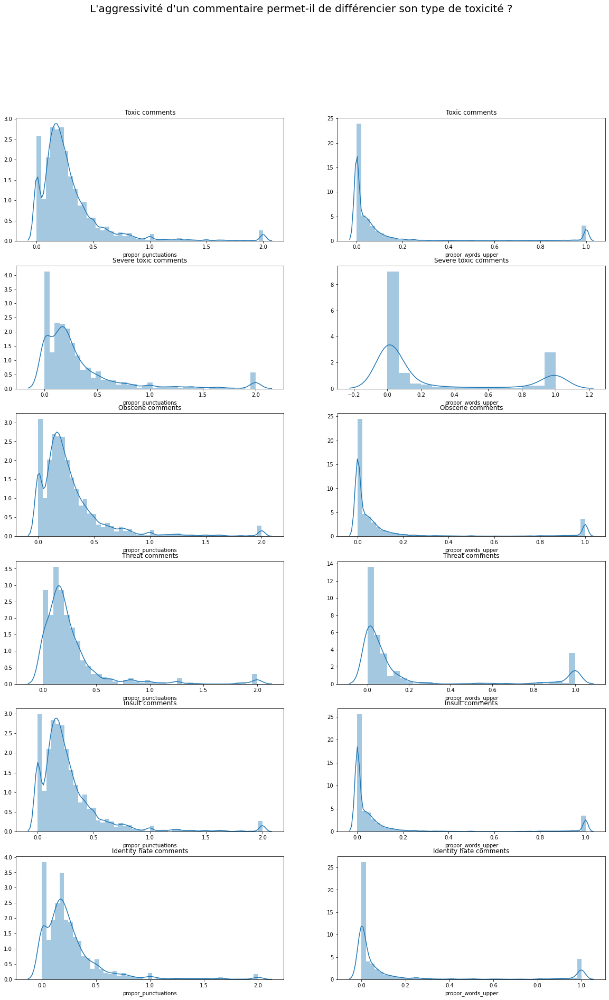

In [0]:
plt.figure(figsize=(20,30))
plt.suptitle("L'aggressivité d'un commentaire permet-il de différencier son type de toxicité ?", fontsize = 20)
plt.subplot(621)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['propor_punctuations'])
plt.subplot(622)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['propor_words_upper'])
plt.subplot(623)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['propor_punctuations'])
plt.subplot(624)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['propor_words_upper'])
plt.subplot(625)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['propor_punctuations'])
plt.subplot(626)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['propor_words_upper'])
plt.subplot(627)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['propor_punctuations'])
plt.subplot(628)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['propor_words_upper'])
plt.subplot(629)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['propor_punctuations'])
plt.subplot(6,2,10)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['propor_words_upper'])
plt.subplot(6,2,11)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['propor_punctuations'])
plt.subplot(6,2,12)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['propor_words_upper'])
plt.show()

Comme nous l'avions observé dans la détermination de la toxicité des commentaires, l'agressivité d'un commentaire permet de déterminer le type de toxicité. 

En effet, on remarque que les commentaires très toxiques et de menace comportent davantage de mots en majuscule, et les insultes comportent davantage de ponctuations. 

Ces variables explicatives sont donc importantes pour notre classification.

#### <u> Impact du champs lexical d'un commentaire sur sa toxicité et son type </u>

Enfin nous allons analyser l'impact de la richesses du champs lexical sur la toxicité des commentaires, en étudiant le nombre de stopwords et de mots uniques utilisés.

In [0]:
features_train['count_stopwords'] = train["comment_text"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords])) # on compte le nombre de stopwords dans un commentaire
features_train['count_unique_word'] = train["comment_text"].apply(lambda x: len(set(str(x).split()))) # on compte le nombre de mots uniques dans un commentaire
features_train['count_stopwords'].loc[features_train['count_stopwords']>100] = 100
features_train['count_unique_word'].loc[features_train['count_unique_word']>100] = 100

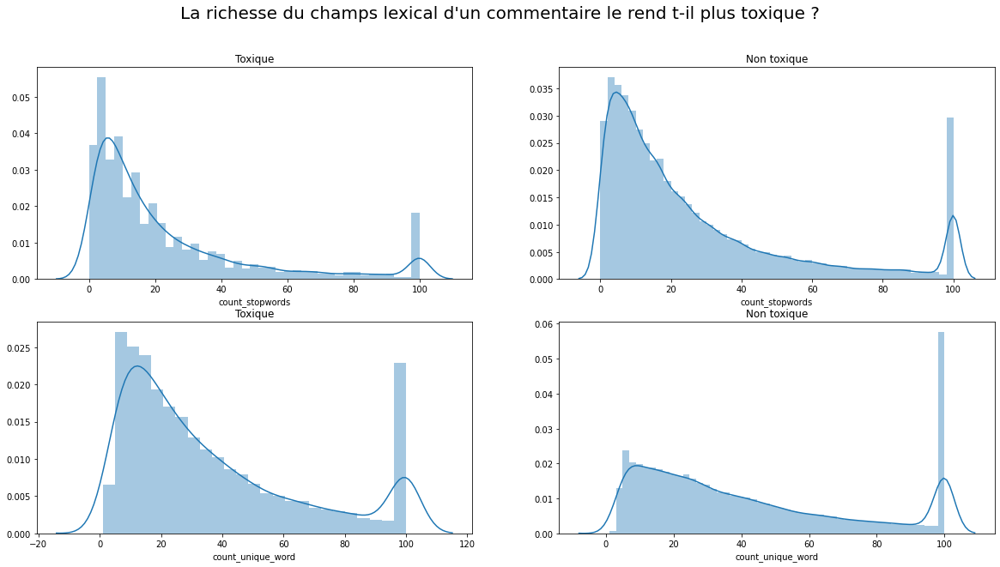

In [0]:
plt.figure(figsize=(20,10))
plt.suptitle("La richesse du champs lexical d'un commentaire le rend t-il plus toxique ?", fontsize = 20)
plt.subplot(221)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['count_stopwords'])
plt.subplot(222)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['count_stopwords'])
plt.subplot(223)
plt.title('Toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == True]['count_unique_word'])
plt.subplot(224)
plt.title('Non toxique', fontsize = 12)
sns.distplot(features_train[features_train['toxic_or_not'] == False]['count_unique_word'])
plt.show()

On constate que la richesse du champs lexical employé dans les commentaires toxiques et non-toxiques est significativement différentes.

En effet, en ce qui concerne le nombre de stopwords employés, généralement utilisés dans les phrases bien construites, est plus important dans les commentaires non-toxiques.

De plus, les commentaires toxiques ont tendance à comporter beaucoup moins de mots uniques. 

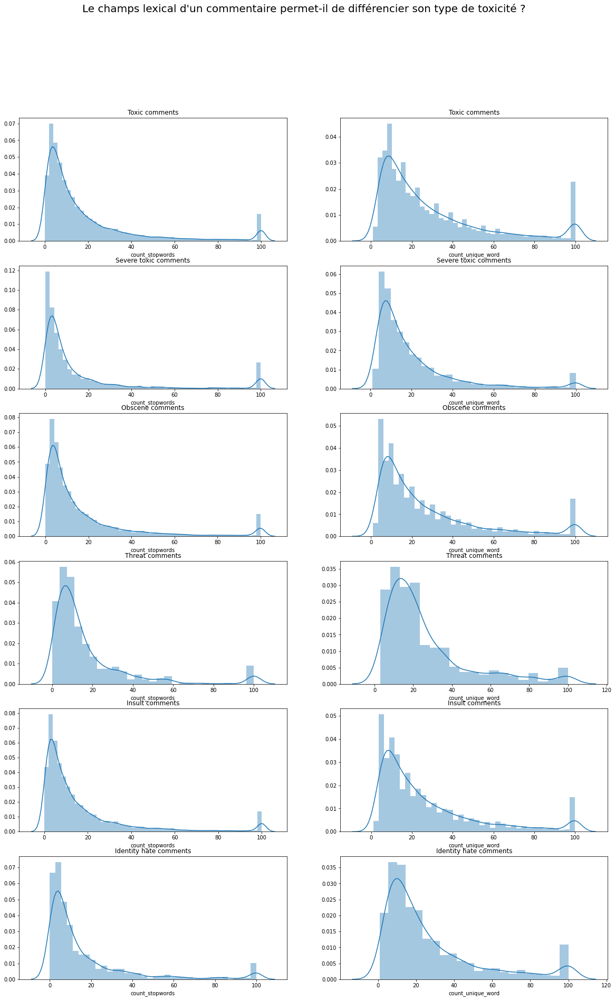

In [0]:
plt.figure(figsize=(20,30))
plt.suptitle("Le champs lexical d'un commentaire permet-il de différencier son type de toxicité ?", fontsize = 20)
plt.subplot(621)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['count_stopwords'])
plt.subplot(622)
plt.title('Toxic comments', fontsize = 12)
sns.distplot(features_train[train['toxic']==1]['count_unique_word'])
plt.subplot(623)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['count_stopwords'])
plt.subplot(624)
plt.title('Severe toxic comments', fontsize = 12)
sns.distplot(features_train[train['severe_toxic']==1]['count_unique_word'])
plt.subplot(625)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['count_stopwords'])
plt.subplot(626)
plt.title('Obscene comments', fontsize = 12)
sns.distplot(features_train[train['obscene']==1]['count_unique_word'])
plt.subplot(627)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['count_stopwords'])
plt.subplot(628)
plt.title('Threat comments', fontsize = 12)
sns.distplot(features_train[train['threat']==1]['count_unique_word'])
plt.subplot(629)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['count_stopwords'])
plt.subplot(6,2,10)
plt.title('Insult comments', fontsize = 12)
sns.distplot(features_train[train['insult']==1]['count_unique_word'])
plt.subplot(6,2,11)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['count_stopwords'])
plt.subplot(6,2,12)
plt.title('Identity hate comments', fontsize = 12)
sns.distplot(features_train[train['identity_hate']==1]['count_unique_word'])
plt.show()

La richesse du champs lexical nous permet d'identifier les types de toxicité des commentaires.

En effet, on remarque que les commentaires très toxiques comportent moins de stopwords, alors que les menaces en comportent davantage que les commentaires avec d'autres types de toxicité. 

Les menaces comportent également beaucoup plus de mots uniques, tous comme les commentaires de haine identitaires.

#### <u> Conclusion sur les variables explicatives </u>

Nous observons que l'aggressivité (nombre de ponctuations et de mots en majuscule) et la richesse du champs lexical (nombre de mots uniques et de stopwords) ont un impact significatif sur la détermination de la toxicité d'un commentaire ou non. 

Ces variables nous semblent être efficaces dans la classification de la toxicité d'un commentaire. En revanche cela ne semble pas être le cas pour la longueur d'un commentaire, nous décidons toute de fois de pousser l'analyse des variables qui la caractérisent (nombre de paragraphes et de mots).

In [0]:
features_test = pd.DataFrame()
features_test['count_paraph'] = test["comment_text"].apply(lambda x: len(re.findall("\n",str(x)))+1) 
features_test['count_word']= test["comment_text"].apply(lambda x: len(str(x).split()))
features_test['count_paraph'].loc[features_test['count_paraph']>10] = 10
features_test['count_word'].loc[features_test['count_word']>200] = 200
features_test['count_punctuations'] = test["comment_text"].apply(lambda x: len([c for c in str(x) if c in string.punctuation])) # on compte le nombre de ponctuations dans un commentaire
features_test['count_words_upper'] = test["comment_text"].apply(lambda x: len([w for w in str(x).split() if w.isupper()])) # on compte le nombre de mots en majuscule dans un commentaire
features_test['propor_punctuations'] = features_test['count_punctuations'] / features_test['count_word'] 
features_test['propor_words_upper'] = features_test['count_words_upper'] / features_test['count_word']
features_test['propor_punctuations'].loc[features_test['propor_punctuations']>2] = 2
features_test['propor_words_upper'].loc[features_test['propor_words_upper']>1] = 1
features_test['count_stopwords'] = test["comment_text"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords])) # on compte le nombre de stopwords dans un commentaire
features_test['count_unique_word'] = test["comment_text"].apply(lambda x: len(set(str(x).split()))) # on compte le nombre de mots uniques dans un commentaire
features_test['count_stopwords'].loc[features_test['count_stopwords']>100] = 100
features_test['count_unique_word'].loc[features_test['count_unique_word']>100] = 100

## **<u> II - Word-level preprocessing et cleaning </u>**

<h5 align='justify'>Cette seconde partie est consacrée à la tokenization et au cleaning des commentaires afin d'en soustraire les informations les plus adéquates et utiles pour l'embedding. 

Dans un premier temps, nous décidons du choix du tokenizer. Ce choix est primordial car il constitue la base pour le cleaning. Dans la partie cleaning, nous décidons de mettre en miniscules les commentaires, de retirer : liens HTML/adresses ip/usernames/ponctuations/stopwords/caractères spéciaux, et enfin de lemmatiser.</h5>

### **<u>II.1 Choix du tokenizer</u>**

In [0]:
tokenizers = [TreebankWordTokenizer(), ToktokTokenizer(), TweetTokenizer()]

for tok in tokenizers:
    arr = train[0:1000]['comment_text'].apply(lambda x: tok.tokenize(x)).array
    arr = reduce(add, arr)
    print(tok)
    print("Taille du vocabulaire : {}".format(tok))  
    print(arr)
    print("")

Taille du vocabulaire : <nltk.tokenize.treebank.TreebankWordTokenizer object at 0x7fce3f118390>
['Explanation', 'Why', 'the', 'edits', 'made', 'under', 'my', 'username', 'Hardcore', 'Metallica', 'Fan', 'were', 'reverted', '?', 'They', 'were', "n't", 'vandalisms', ',', 'just', 'closure', 'on', 'some', 'GAs', 'after', 'I', 'voted', 'at', 'New', 'York', 'Dolls', 'FAC.', 'And', 'please', 'do', "n't", 'remove', 'the', 'template', 'from', 'the', 'talk', 'page', 'since', 'I', "'m", 'retired', 'now.89.205.38.27', "D'aww", '!', 'He', 'matches', 'this', 'background', 'colour', 'I', "'m", 'seemingly', 'stuck', 'with.', 'Thanks.', '(', 'talk', ')', '21:51', ',', 'January', '11', ',', '2016', '(', 'UTC', ')', 'Hey', 'man', ',', 'I', "'m", 'really', 'not', 'trying', 'to', 'edit', 'war.', 'It', "'s", 'just', 'that', 'this', 'guy', 'is', 'constantly', 'removing', 'relevant', 'information', 'and', 'talking', 'to', 'me', 'through', 'edits', 'instead', 'of', 'my', 'talk', 'page.', 'He', 'seems', 'to', 'c

Notre choix final se porte sur le TweetTokenizer car il ne sépare pas les apostrophes et ainsi nous permet de récupérer les mots négatifs tel que "weren't" dans un seul token. Il permet également de récupérer les adresses IP entièrement afin de pouvoir les supprimer plus facilement par la suite.


In [0]:
tokenizer = TweetTokenizer()

### **<u>II.2 Cleaning et tokenization</u>**



In [0]:
def clean_comment(comment):
  
  def cleanPonct(comment): 
    clean = re.sub(r'[?|!|\'|"|#|*|:|=|-|—]',r'', comment)
    clean = re.sub(r'[.|,|)|(|\|/]',r' ', clean)
    clean = clean.strip()
    clean = clean.replace("\n"," ")
    return clean

  comment = comment.lower() # mettre en minuscules
  comment = re.sub(re.compile('<.*?>'), ' ', comment) # retirer les liens HTML
  comment = re.sub("\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3}","", comment) # retirer les adresses ip
  comment = re.sub("\[\[.*\]","", comment) # retirer les usernames
  comment = cleanPonct(comment) # retirer les ponctuations
  
  words = tokenizer.tokenize(comment) # tokenization
  words = [APPO[word] if word in APPO else word for word in words] # remplacer des apostrophes (ex: you're -> you are)
  words = [lem.lemmatize(word, "v") for word in words] # lemmatiser
  words = [w for w in words if not w in eng_stopwords] # retirer les stopwords
  
  return(words)

Nous appliquons par la suite cette fonction de cleaning sur les commentaires du training et testing set.

In [0]:
%%time

train['clean_words'] = train['comment_text'].apply(lambda x : clean_comment(x))
train['clean_comment'] = train['clean_words'].apply(lambda x : " ".join(x))
test['clean_words'] = test['comment_text'].apply(lambda x : clean_comment(x))
test['clean_comment'] = test['clean_words'].apply(lambda x : " ".join(x))

CPU times: user 1min 32s, sys: 495 ms, total: 1min 32s
Wall time: 1min 32s


### **<u>II.3 WordCloud</u>**

**Toxic comments :**

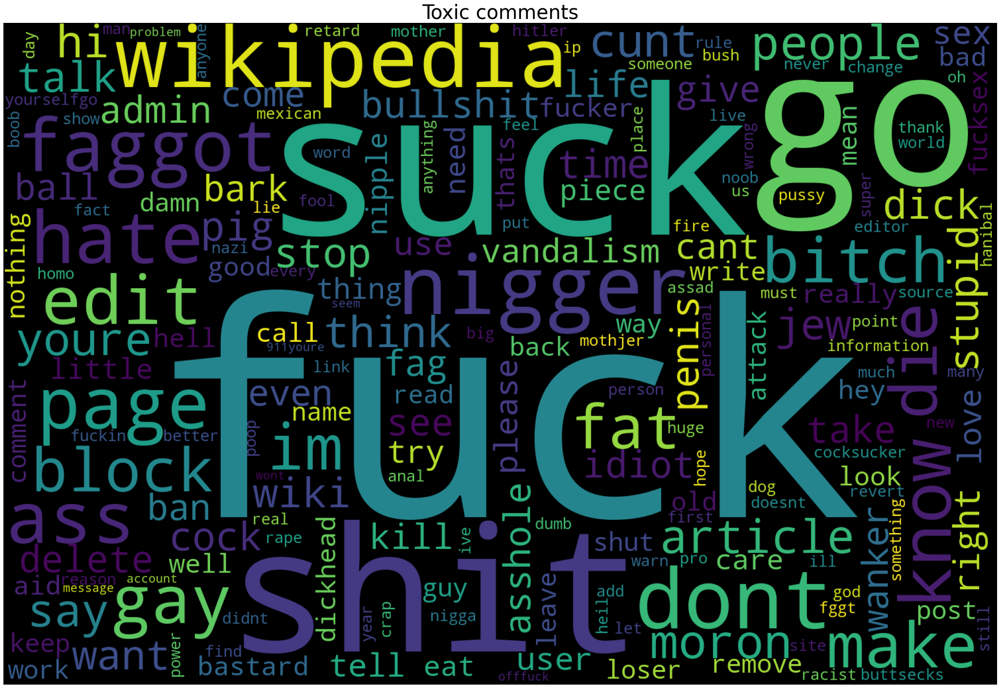

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['toxic']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Toxic comments', fontsize = 40)
plt.imshow(cloud)

**Severe toxic comments :**

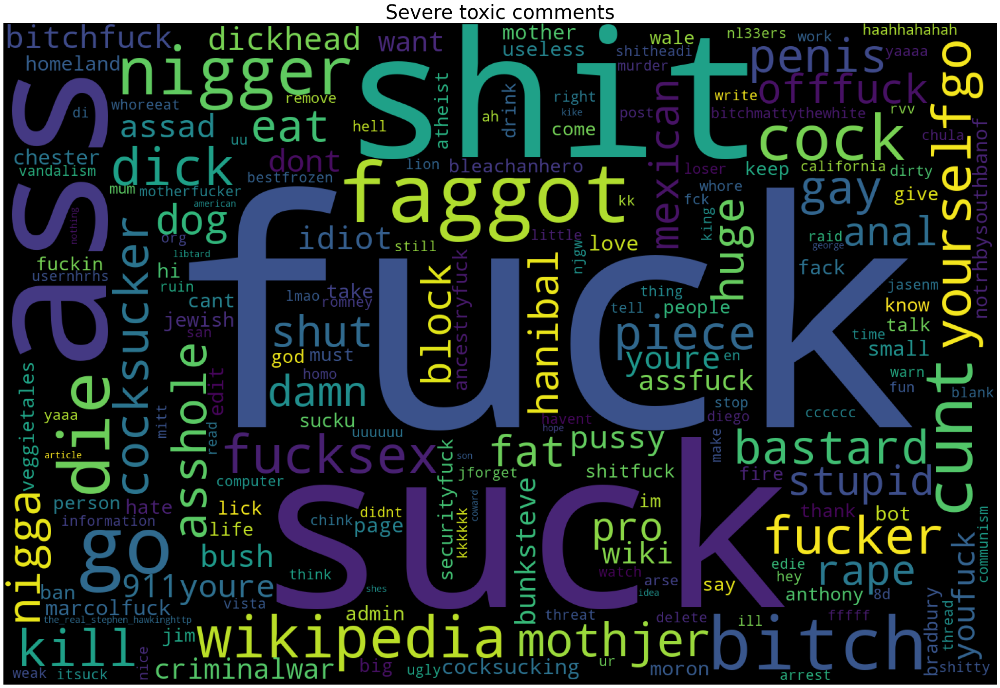

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['severe_toxic']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Severe toxic comments', fontsize = 40)
plt.imshow(cloud)

**Obscene comments :**

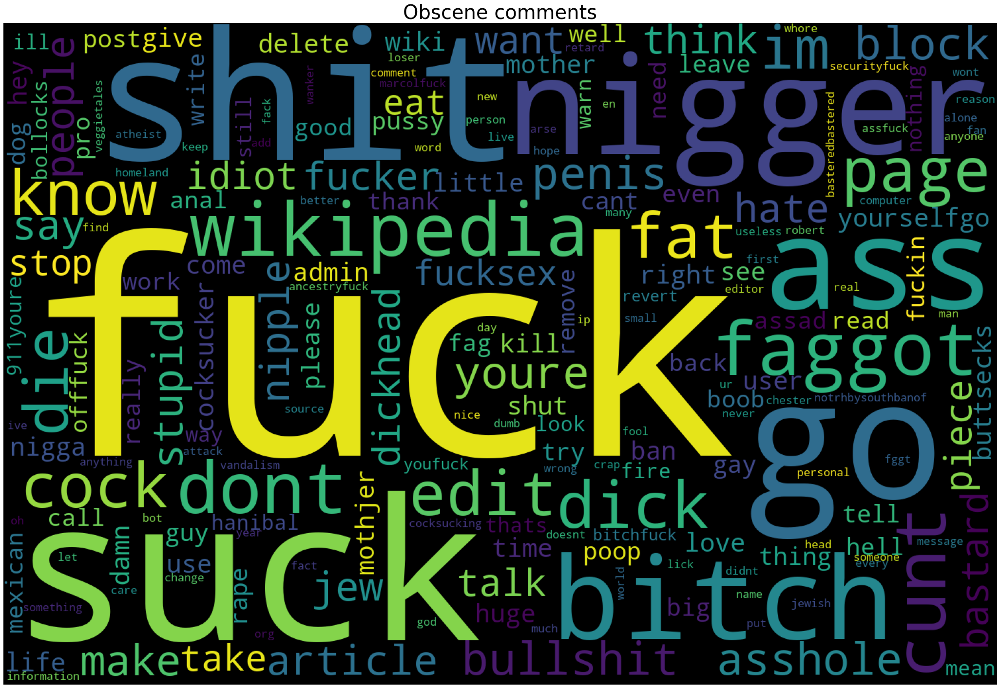

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['obscene']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Obscene comments', fontsize = 40)
plt.imshow(cloud)

**Threat comments :**

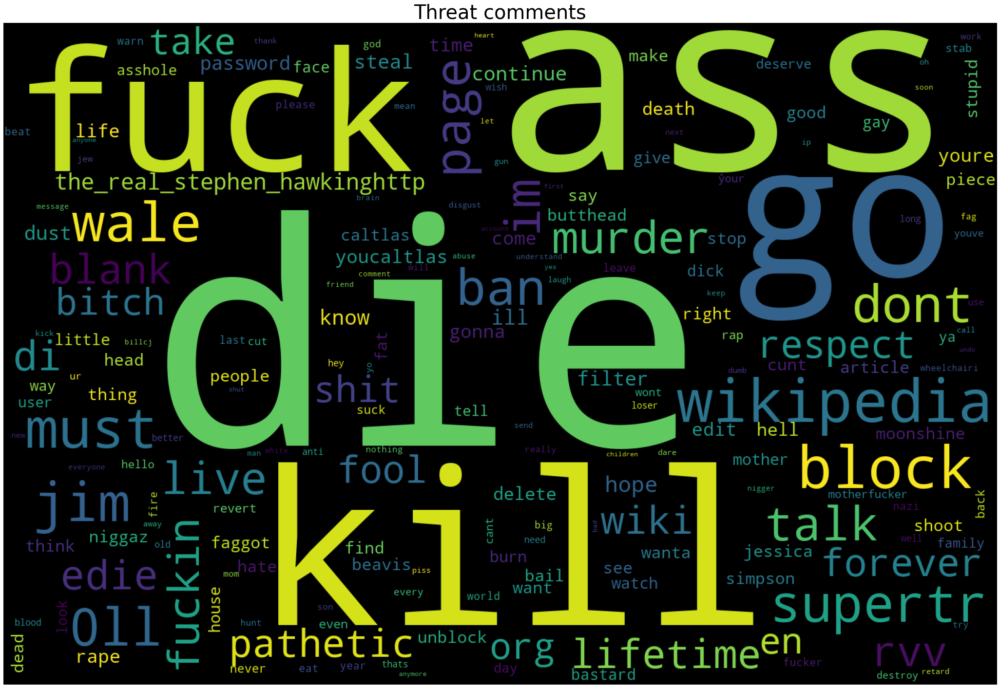

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['threat']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Threat comments', fontsize = 40)
plt.imshow(cloud)

**Insult comments :**

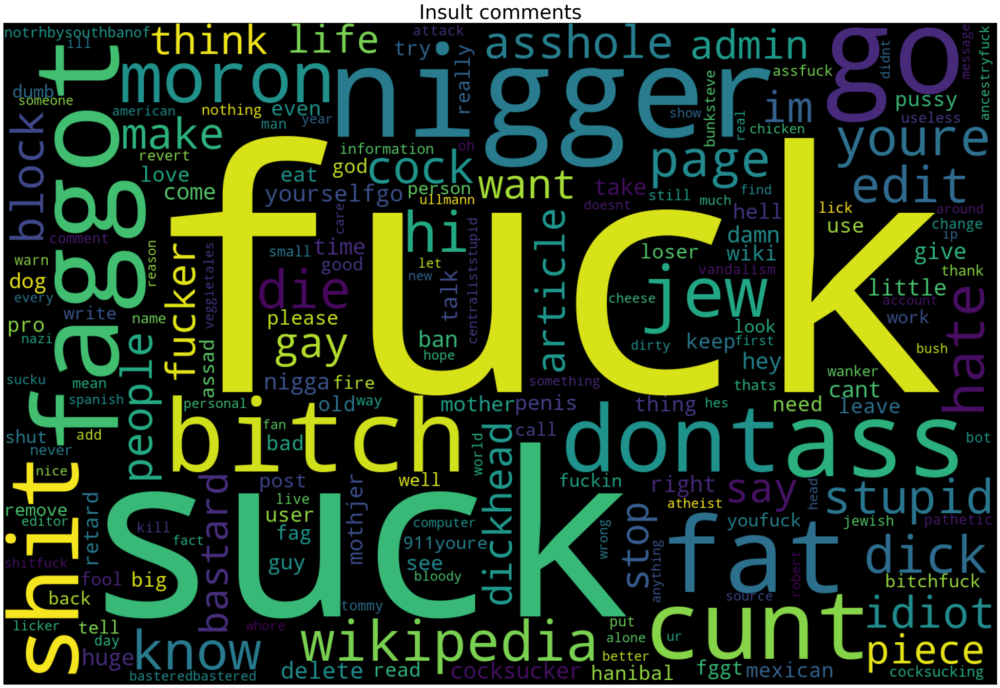

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['insult']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Insult comments', fontsize = 40)
plt.imshow(cloud)

**Identity hate comments :**

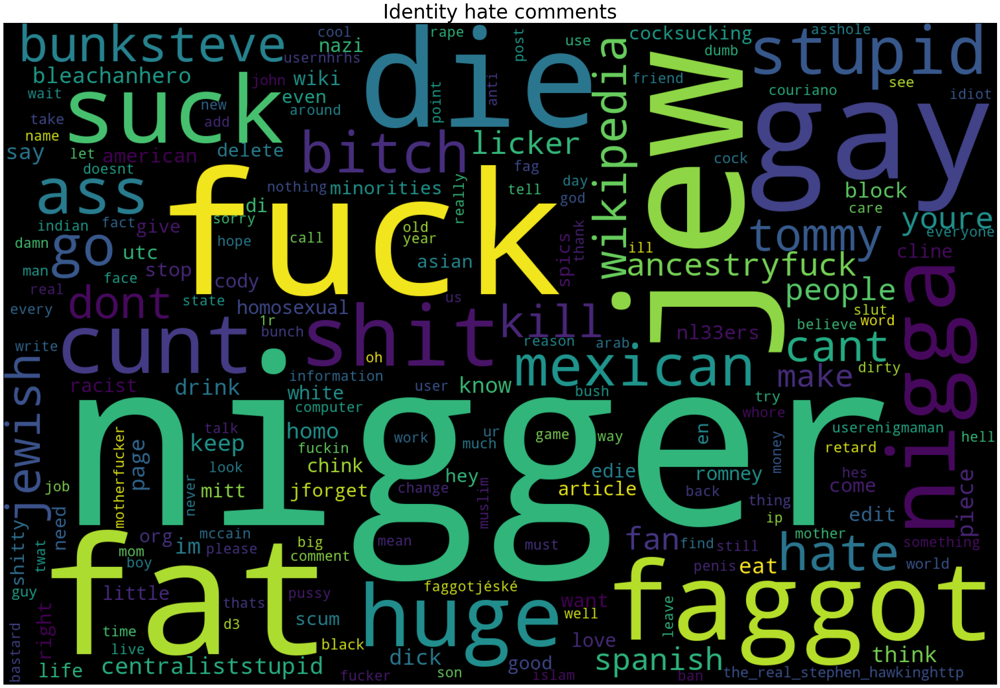

In [0]:
plt.figure(figsize=(40,25))
subset = train.where(train['identity_hate']==1).dropna()
text = subset['clean_comment'].values
cloud = WordCloud(stopwords = STOPWORDS, background_color = 'black', collocations = False, width = 1500, height = 1000).generate(" ".join(text))
plt.axis('off')
plt.title('Identity hate comments', fontsize = 40)
plt.imshow(cloud)

Nous observons que les mêmes mots reviennent assez souvent dans les différentes catégories de toxicité. Nous comprenons alors que le travail de classification ne s'effectuera pas uniquement sur les mots mais également en fonction du contexte dans lesquels ils sont employés.

## **<u> III - Embedding</u>**

<h5 align='justify'>Cette troisième partie est consacrée à l'embedding des commentaires et est cruciale car elle permet de construire le vecteur de prédiction principal pour notre modèle de classification. Autrement dit, le bon fonctionnement de notre modèle de classification se basera principalement sur l'embedding, il est alors essentiel de fournir des embeddings de qualité.

Pour cela nous avons décidé de tester 3 méthodes d'embedding : 

1.   TF-IDF (Term Frequency-Inverse Document Frequency)
2.   Word2Vec's Skip-Gram en utilisant le modèle pré-entrainé de Google News
3.   Doc2Vec's PV-DBOW

Pour chacune des méthodes citées, nous décidons de réduire à 300 la dimension des vecteurs. En effet, malgré qu'aucun papier n'ait démontré une dimension optimale pour la taille des embeddings, beaucoup utilisent une dimension arbitraire de 100 ou 300. Certains papiers ont constaté qu'il n'y avait qu'une faible amélioration de la précision du modèle pour une dimension supérieure à 300.

Dans la prochaine partie, nous mettrons à l'épreuve ces 3 modèles afin de ne retenir que celui qui minimise la loss de notre modèle. </h5>




### **<u>III.1 TF-IDF</u>**



In [0]:
%%time

tfidf = TfidfVectorizer(max_features = 300, strip_accents = 'unicode', analyzer = 'word', ngram_range=(1,1), use_idf=1, smooth_idf = 1, sublinear_tf = 1)
tfidf.fit(train['clean_comment'])
TFIDF_train = tfidf.transform(train['clean_comment'])
TFIDF_test = tfidf.transform(test['clean_comment'])
sparse.save_npz("TFIDF_train.npz", TFIDF_train)
sparse.save_npz("TFIDF_test.npz", TFIDF_test)

CPU times: user 13.7 s, sys: 99 ms, total: 13.8 s
Wall time: 13.8 s


### **<u>III.2 Word2Vec</u>**

In [0]:
!wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"

--2020-04-18 23:33:00--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.15.182
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.15.182|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: ‘GoogleNews-vectors-negative300.bin.gz’

GoogleNews-vectors- 100%[===================>]   1.53G  16.9MB/s    in 97s     

2020-04-18 23:34:38 (16.2 MB/s) - ‘GoogleNews-vectors-negative300.bin.gz’ saved [1647046227/1647046227]



In [0]:
list_train = train.clean_words.to_list()
list_test = test.clean_words.to_list()

In [0]:
%%time

Word2VecModel = Word2Vec(sg = 1, size = 300, min_count = 5, window = 6, workers = 16, negative = 5, iter = 15)
Word2VecModel.build_vocab(list_train)
GoogleNewsModel = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary=True)
Word2VecModel.build_vocab([list(GoogleNewsModel.vocab.keys())], update = True)
Word2VecModel.intersect_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary = True, lockf = 1.0)
Word2VecModel.train(list_train, total_examples = Word2VecModel.corpus_count, epochs = Word2VecModel.iter)

CPU times: user 26min 39s, sys: 4.93 s, total: 26min 44s
Wall time: 9min


Afin d'obtenir un vecteur d'embedding par commentaire, nous décidons d'aggréger les embeddings de mots en faisant la moyenne.

In [0]:
%%time

Word2Vec_train = []
for c in list_train:
  comment = []
  for w in c:
    if w in Word2VecModel.wv.vocab:
        comment.append(Word2VecModel.wv[w])
    else:
        comment.append(np.zeros(300))
  Word2Vec_train.append(np.mean(comment, axis = 0))
np.savez_compressed("Word2Vec_train.npz", Word2Vec_train)

CPU times: user 34.7 s, sys: 2.24 s, total: 37 s
Wall time: 37 s


In [0]:
%%time

Word2Vec_test = []
for c in list_test:
  comment = []
  for w in c:
    if w in Word2VecModel.wv.vocab:
        comment.append(Word2VecModel.wv[w])
    else:
        comment.append(np.zeros(300))
  Word2Vec_test.append(np.mean(comment, axis = 0))
np.savez_compressed("Word2Vec_test.npz", Word2Vec_test)

CPU times: user 14.6 s, sys: 142 ms, total: 14.7 s
Wall time: 14.7 s


### **<u>III.3 Doc2Vec</u>**

In [0]:
train_tagged = train.apply(lambda r: TaggedDocument(words=r['clean_words'], tags=[r['toxic'], r['severe_toxic'], r['obscene'], r['threat'], r['insult'], r['identity_hate']]), axis=1)

In [0]:
%%time

Doc2VecModel = Doc2Vec(dm = 0, vector_size = 300, min_cout = 5, workers = 4, negative = 5, epochs = 15, dbow_words = 1)
Doc2VecModel.build_vocab([x for x in tqdm(train_tagged.values)])
Doc2VecModel.train([x for x in tqdm(train_tagged.values)], total_examples = Doc2VecModel.corpus_count, epochs = Doc2VecModel.epochs)

100%|██████████| 159571/159571 [00:00<00:00, 3382179.14it/s]


CPU times: user 53min 30s, sys: 25.9 s, total: 53min 56s
Wall time: 14min 8s


In [0]:
%%time

Doc2Vec_train = [Doc2VecModel.infer_vector(comment, steps=20) for comment in train['clean_words']]
Doc2Vec_test = [Doc2VecModel.infer_vector(comment, steps=20) for comment in test['clean_words']]
np.savez_compressed("Doc2Vec_train.npz", Doc2Vec_train)
np.savez_compressed("Doc2Vec_test.npz", Doc2Vec_test)

CPU times: user 6min 39s, sys: 1.23 s, total: 6min 41s
Wall time: 6min 41s


### **<u>III.4 Comparaison</u>**

<h5 align='justify'>Nous nous attendons à que Word2Vec et Doc2Vec soient plus efficaces que TF-IDF qui n'évalue que l'importance d'un terme contenu dans un document, relativement à une collection ou un corpus mais qui ne prend pas en compte le contexte du document dans lesquels les mots sont utilisés. 

La principale différence entre Word2vec et Doc2vec réside dans le fait que Word2Vec s'applique sur des mots et essaye d'en trouver des similarités alors que Doc2Vec s'applique sur des documents et le/les tags qui y sont associés. Pour notre problème nous pensons que Doc2Vec sera plus efficace étant donné que nous travaillons sur des commentaires pouvant avoir plusieurs labels (ou tags) de toxicité. Dans le cas de Word2Vec, il est nécessaire d'appliquer une méthode d'aggrégation des embeddings afin d'obtenir un embedding sur le commentaire. Nous utilisons la moyenne comme méthode d'aggrégation.</h5>

## **<u> IV - Modèles de classification</u>**

<h5 align='justify'>Nous allons désormais utiliser les features que nous avions créés précédemment que cela soit avec les embeddings ou en comptant le nombre de mots, le nombre de ponctuations, etc.

Le problème sur lequel nous travaillons est un problème de classification multi-label. Certains commentaires ont plusieurs labels et il faut donc prendre en compte ce point.

Nous avons fait le choix d'essayer 3 algorithmes différents : 
1.   Régression Logistique
2.   LGBM (Light Gradient Boosting)
3.   LSTM Bidirectionnel (Long Short-Term Memory)

La régression logistique et le LGBM ne peuvent pas traiter de problèmes de classification multi-label. Pour contourner ce problème, nous implémentons ces deux modèles pour chacunes des classes de toxicité de manière indépendante. Ce n'est pas le cas du LSTM Bidirectionnel qui est capable de traiter de problèmes de classification multi-label.

Nous appliquons ensuite un threshold égal à 0.5 afin de classifier les commentaires (les commentaires ayant une probabilité supérieure à 0.5 d'appartenir à une classe de toxicité sont classifiés comme tel, et inversement). Cela nous permet ensuite d'étudier la qualité de notre prédiction, notamment à l'aide de métriques classiques (courbe roc, auc et matrice de confusion). 

Nous utilisons une perte Log Loss / Binary Cross-Entropy afin d'évaluer nos différents modèles, l'objectif final étant de choisir le couple (embedding, modèle) qui minimise cette perte sur le testing data set.</h5>

### **<u>IV.0 Fonctions</u>**

In [0]:
TFIDF_train = sparse.load_npz('TFIDF_train.npz')
TFIDF_test = sparse.load_npz('TFIDF_test.npz')

Doc2Vec_train = np.load('Doc2Vec_train.npz')['arr_0']
Doc2Vec_test = np.load('Doc2Vec_test.npz')['arr_0']

Word2Vec_train = np.load('Word2Vec_train.npz', allow_pickle = True)['arr_0']
Word2Vec_test = np.load('Word2Vec_test.npz', allow_pickle = True)['arr_0']

In [0]:
vec = []
for i in Word2Vec_train:
  wv = i.tolist()
  if type(wv) == float:
    vec.append(np.zeros(300))
  else:
    vec2 = []
    for j in wv:
      a = float(j)
      vec2.append(float(j))
    vec.append(vec2)
Word2Vec_train = vec

vec = []
for i in Word2Vec_test:
  wv = i.tolist()
  if type(wv) == float:
    vec.append(np.zeros(300))
  else:
    vec2 = []
    for j in wv:
      a = float(j)
      vec2.append(float(j))
    vec.append(vec2)
Word2Vec_test = vec

In [0]:
def classification(model, X_train, y_train, X_test, y_test):

  train_loss = []
  test_loss = []
  importance = []
  y_pred = []

  for i, j in enumerate(y_train.columns):
    model.fit(X_train, y_train[j])
    preds_train_class = model.predict_proba(X_train)[:,1]
    preds_test_class = model.predict_proba(X_test)[:,1]
    train_loss_class = log_loss(y_train[j], preds_train_class)
    test_loss_class = log_loss(y_test[j], preds_test_class)
    
    if type(model) == LogisticRegression: importance.append(model.coef_)
    if type(model) == lgb.LGBMClassifier: importance.append(model.feature_importances_)
    y_pred.append(preds_test_class)
    train_loss.append(train_loss_class)
    test_loss.append(test_loss_class)

  df = pd.DataFrame({'Toxicity class': y_train.columns, 'Logloss train': train_loss, 'Logloss test': test_loss}).set_index('Toxicity class')

  return(importance, df, y_pred)

In [0]:
def plot_importance(importance, title, col_names, features):

  plt.figure(figsize=(16,22))
  plt.suptitle(title, fontsize=20)
  gridspec.GridSpec(3,2)
  plt.subplots_adjust(hspace=0.4)

  i=0
  pos_i=0
  pos_j=0

  for col in col_names:
    plt.subplot2grid((3,2),(pos_i,pos_j))
    sns.barplot(features, importance[i][0])
    plt.title("class : " + col_names[i], fontsize=15)
    locs, labels = plt.xticks()
    plt.setp(labels, rotation=45)
    plt.xlabel('Feature', fontsize=12)
    plt.ylabel('Importance', fontsize=12)
    i+=1
    if pos_j==0:
      pos_j=1
    else:
      pos_i+=1
      pos_j=0

In [0]:
def plot_metrics(y_pred_all, y_true_all, classe_names, threshold):
  
  for c, classe in enumerate(classe_names):
    print(classe + ' :')
    y_pred_proba = y_pred_all[c]
    y_true = y_true_all[classe]
  
    y_pred = pd.DataFrame(y_pred_proba).rename(columns={0:classe})
    y_pred[y_pred[classe]>threshold] = 1
    y_pred[y_pred[classe]<threshold] = 0

    CM = confusion_matrix(y_true, y_pred)
    Accuracy = accuracy_score(y_true, y_pred)
    Recall = recall_score(y_true, y_pred)
    Precision = precision_score(y_true, y_pred)
    F_score = f1_score(y_true, y_pred)

    df = pd.DataFrame({'Metrics': ['Accuracy', 'Recall', 'Precision', 'F-Score'], 'Value': [Accuracy, Recall, Precision, F_score]})
    df.set_index('Metrics', inplace=True)
    print(df)
    print('')

    ROC = roc_auc_score(y_true,y_pred) 
    print ("AUC : ",ROC)

    fpr,tpr,thresholds = roc_curve(y_true,y_pred_proba)
    plt.figure(figsize=(12,10))
    plt.subplot(221)
    sns.heatmap(CM/np.sum(CM), annot=True, fmt='.2%', cmap='Blues').set_title('Matrice de confusion')
    plt.subplot(222)
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % ROC)
    plt.plot([0,1],[0,1],color='red')
    plt.title('Courbe ROC')
    plt.show()

### **<u>IV.1 Régression logistique</u>**

<h5 align='justify'>Nous allons tester ce modèle sur nos features et embedding, et en déduire à l'aide de ces métriques, l'embedding le plus approprié pour ce modèle.</h5>



#### <u>Avec les features et sans embedding</u>

Nous effectuons une première régression sur les features que nous avons créés, sans les embeddings, afin de pouvoir étudier l'importance des différents features, ainsi que de souligner l'utilité des embedding (nous nous attendons à de meilleurs scores sur les classification avec les embedding).

In [0]:
X_train = features_train.iloc[:,1:]
y_train = train.iloc[:,2:8]
X_test = features_test
y_test = test.iloc[:,2:8]

[importance_logreg, logloss_logreg, y_pred_logreg] = classification(LogisticRegression(n_jobs = -1), X_train, y_train, X_test, y_test)

In [0]:
logloss_logreg

,Logloss train,Logloss test
Toxicity class,,
toxic,0.293584,0.291345
severe_toxic,0.048288,0.033867
obscene,0.192551,0.203385
threat,0.019186,0.020842
insult,0.183836,0.193614
identity_hate,0.047713,0.057055


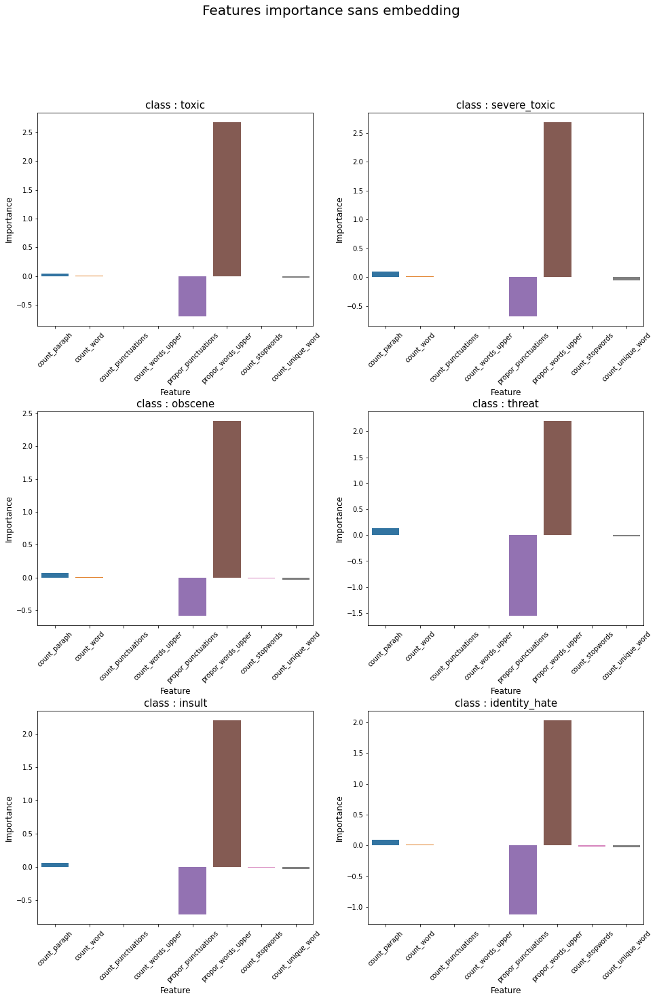

In [0]:
plot_importance(importance_logreg, 'Features importance sans embedding', y_train.columns, X_train.columns)

Nous observons que les coefficients de la régression logistique sont relativement les mêmes d'une classe à l'autre. Le coefficient le plus important étant la proportions de mots en majuscules, ce qui nous semble cohérent. Un autre coefficient important est la proportion de ponctuations (coefficient négatif).

On remarque en effet que les features représentant des proportions sont plus importants dans la classification que les features représentant des comptages. Cela souligne l'importance de prendre en compte le nombre de mots dans le commentaire. 

Par exemple, un commentaire très long et très formel comportera peut-être autant de ponctuations qu'un commentaire haineux comportant 10 points d'exclamation pour 3 mots. 

toxic :
              Value
Metrics            
Accuracy   0.905546
Recall     0.077176
Precision  0.526316
F-Score    0.134613

AUC :  0.5349342419675024


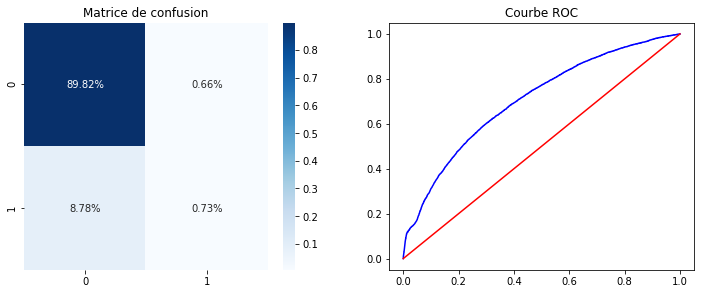

severe_toxic :
              Value
Metrics            
Accuracy   0.993529
Recall     0.035422
Precision  0.178082
F-Score    0.059091

AUC :  0.5172395551178169


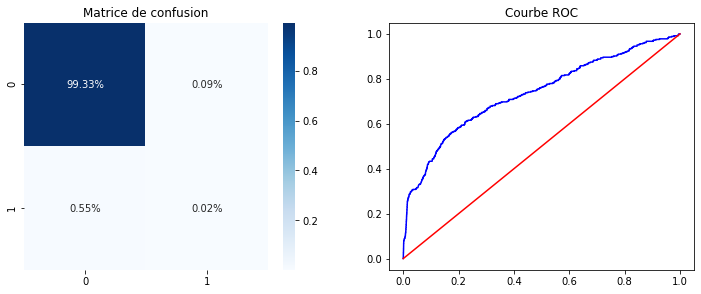

obscene :
              Value
Metrics            
Accuracy   0.941949
Recall     0.019778
Precision  0.431953
F-Score    0.037824

AUC :  0.509092727441726


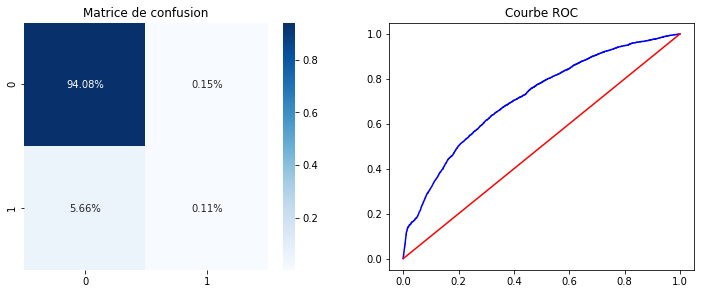

threat :
              Value
Metrics            
Accuracy   0.996702
Recall     0.000000
Precision  0.000000
F-Score    0.000000

AUC :  0.5


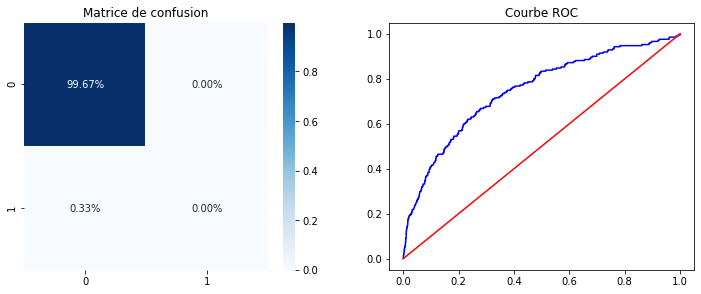

insult :
              Value
Metrics            
Accuracy   0.946247
Recall     0.011964
Precision  0.436170
F-Score    0.023289

AUC :  0.5055442607718245


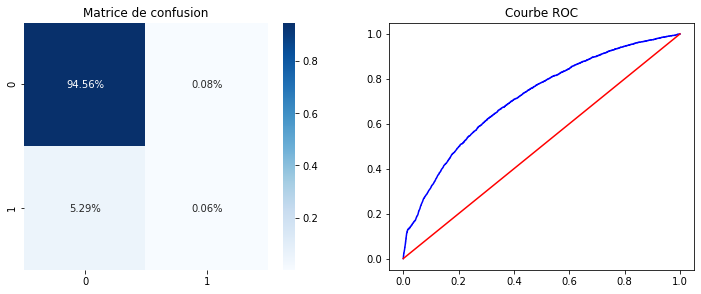

identity_hate :
              Value
Metrics            
Accuracy   0.988809
Recall     0.001404
Precision  0.166667
F-Score    0.002786

AUC :  0.5006627314953769


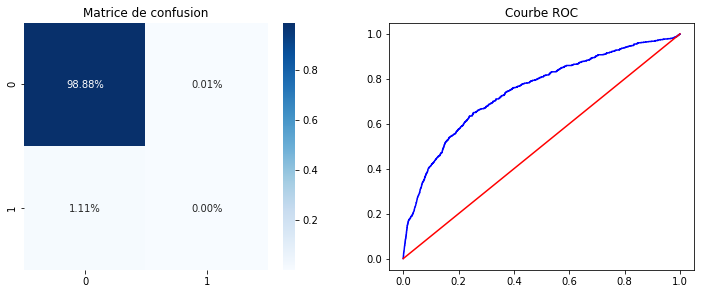

In [0]:
plot_metrics(y_pred_logreg, y_test, y_test.columns, 0.5)

A la vue des courbes ROC et du F1-Score, les prédictions ne sont pas très bonnes lorsque nous utilisons seulement les features. En effet, on voit que le modèle n'arrive quasiment jamais à prédire la bonne toxicité de la classe. On remarque également que les pertes sont assez importantes (une perte de 29% sur la classe `toxic`...).

Regardons l'impact de l'utilisation des embeddings.

#### <u>Avec les features et TF-IDF </u>

In [0]:
X_train = hstack((TFIDF_train, np.array(features_train.iloc[:,1:]))).tocsr()
y_train = train.iloc[:,2:8]
X_test = hstack((TFIDF_test, np.array(features_test))).tocsr()
y_test = test.iloc[:,2:8]

In [0]:
[importance_logreg_TFIDF, logloss_logreg_TFIDF, y_pred_logreg_TFIDF] = classification(LogisticRegression(n_jobs=-1), X_train, y_train, X_test, y_test)

In [0]:
logloss_logreg_TFIDF

,Logloss train,Logloss test
Toxicity class,,
toxic,0.203363,0.242544
severe_toxic,0.034116,0.027497
obscene,0.112100,0.145020
threat,0.015589,0.018239
insult,0.126540,0.157724
identity_hate,0.041538,0.051439


toxic :
              Value
Metrics            
Accuracy   0.919910
Recall     0.361248
Precision  0.640652
F-Score    0.461991

AUC :  0.6699654607368194


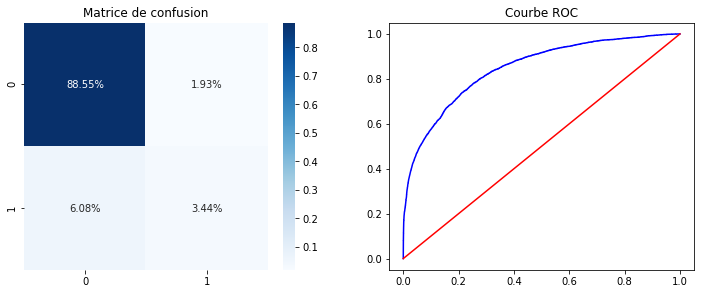

severe_toxic :
              Value
Metrics            
Accuracy   0.991169
Recall     0.198910
Precision  0.212209
F-Score    0.205345

AUC :  0.5973249061468084


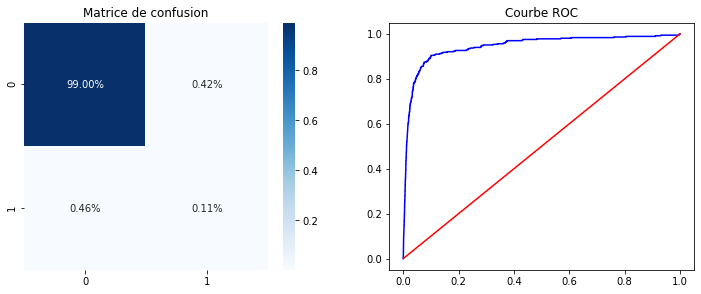

obscene :
              Value
Metrics            
Accuracy   0.957610
Recall     0.379030
Precision  0.769104
F-Score    0.507804

AUC :  0.6860316985423787


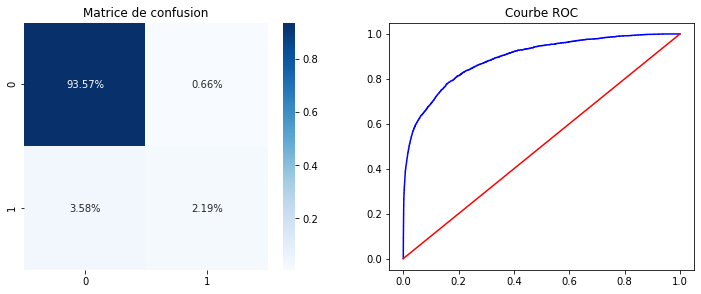

threat :
              Value
Metrics            
Accuracy   0.996655
Recall     0.014218
Precision  0.333333
F-Score    0.027273

AUC :  0.5070619584614813


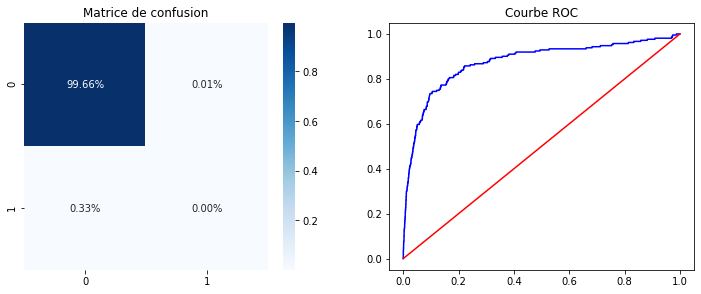

insult :
              Value
Metrics            
Accuracy   0.952671
Recall     0.311935
Precision  0.614721
F-Score    0.413860

AUC :  0.650434792054102


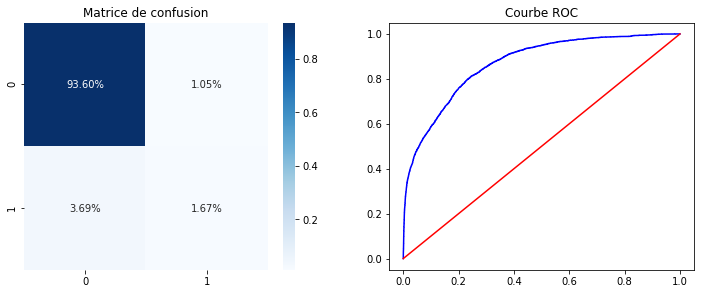

identity_hate :
              Value
Metrics            
Accuracy   0.988355
Recall     0.015449
Precision  0.200000
F-Score    0.028683

AUC :  0.5073769809795418


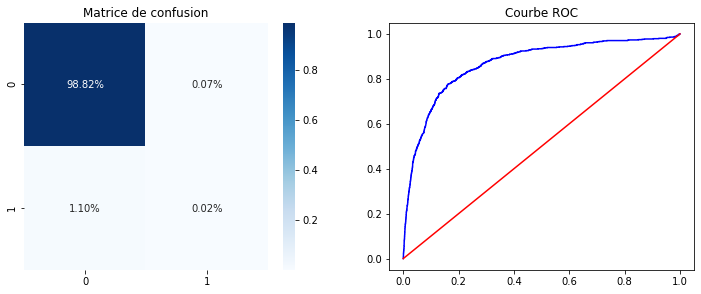

In [0]:
plot_metrics(y_pred_logreg_TFIDF, y_test, y_test.columns, 0.5)

L'ajout des embedding TF-IDF permet de diminuer nettement la perte et cela pour toutes les différentes classes de toxicité. Cela montre que l'embedding est important dans la classification de textes. 

Toutefois, nous observons que les F-Score ne sont si bons que cela, nous espérons qu'ils s'améliorent par la suite.

Il faut maintenant comparer ce résultat à celui obtenu avec les autres embedding afin de savoir quel est le meilleur embedding qu'on puisse associer à la regression logistique.

#### <u>Avec les features et Word2Vec </u>

In [0]:
X_train = np.concatenate((np.array(Word2Vec_train), features_train.iloc[:,1:]), axis = 1)
y_train = train.iloc[:,2:8]
X_test = np.concatenate((Word2Vec_test, features_test), axis = 1)
y_test = test.iloc[:,2:8]

In [0]:
%%time

[importance_logreg_W2V, logloss_logreg_W2V, y_pred_logreg_W2V] = classification(LogisticRegression(n_jobs = -1), X_train, y_train, X_test, y_test)

CPU times: user 2.41 s, sys: 3.31 s, total: 5.72 s
Wall time: 9min 56s


In [0]:
logloss_logreg_W2V

,Logloss train,Logloss test
Toxicity class,,
toxic,0.153321,0.199953
severe_toxic,0.032194,0.029101
obscene,0.089627,0.131446
threat,0.016197,0.018919
insult,0.106191,0.138477
identity_hate,0.035125,0.044089


toxic :
              Value
Metrics            
Accuracy   0.930335
Recall     0.579146
Precision  0.650618
F-Score    0.612805

AUC :  0.7732138942670338


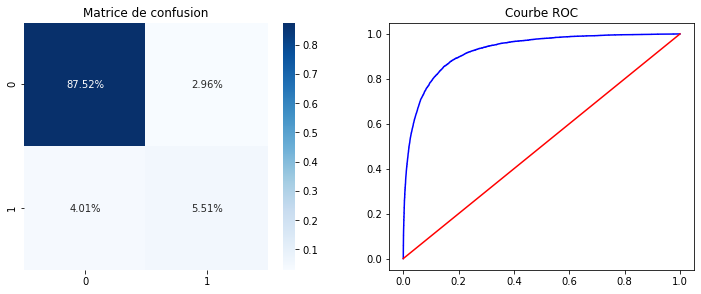

severe_toxic :
              Value
Metrics            
Accuracy   0.991700
Recall     0.188011
Precision  0.228477
F-Score    0.206278

AUC :  0.5921740053442165


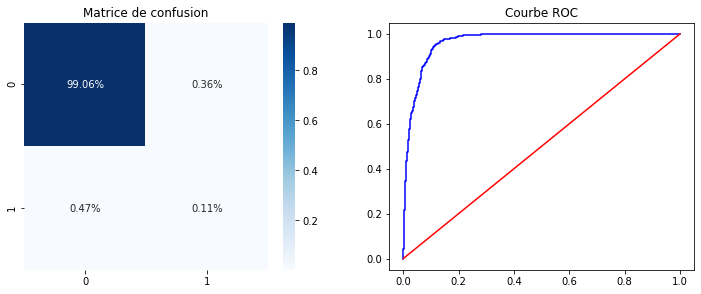

obscene :
              Value
Metrics            
Accuracy   0.955969
Recall     0.545923
Precision  0.638466
F-Score    0.588579

AUC :  0.7634981887887063


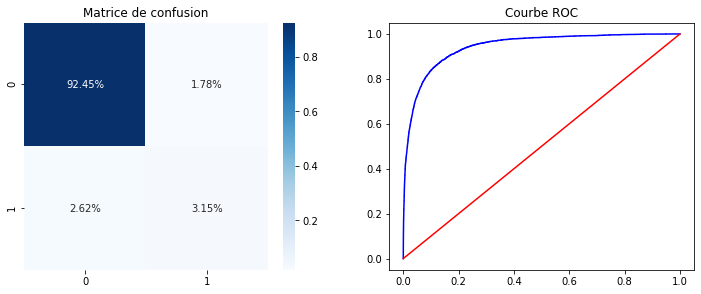

threat :
              Value
Metrics            
Accuracy   0.996421
Recall     0.009479
Precision  0.090909
F-Score    0.017167

AUC :  0.5045825155667066


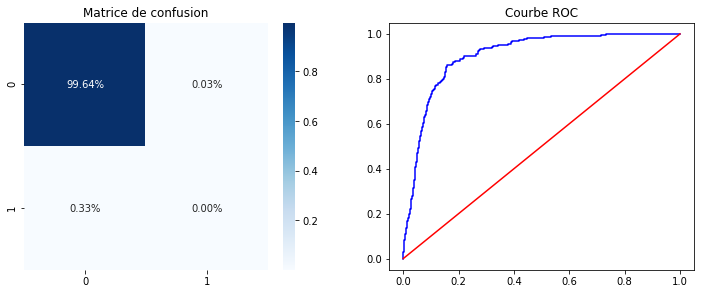

insult :
              Value
Metrics            
Accuracy   0.953969
Recall     0.400058
Precision  0.606637
F-Score    0.482152

AUC :  0.692688260815736


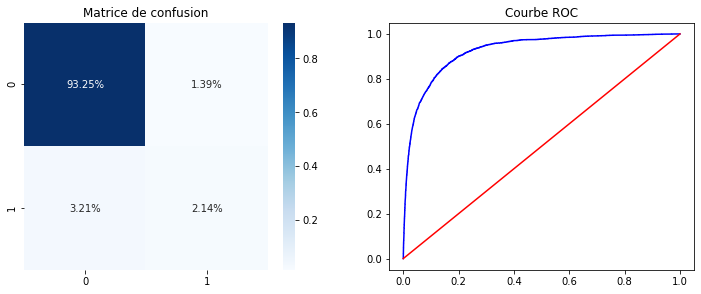

identity_hate :
              Value
Metrics            
Accuracy   0.988777
Recall     0.089888
Precision  0.477612
F-Score    0.151300

AUC :  0.5443906004858388


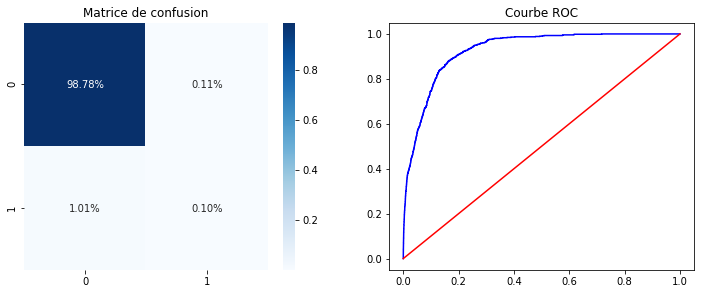

In [0]:
plot_metrics(y_pred_logreg_W2V, y_test, y_test.columns, 0.5)

Le fait d'utiliser les vecteurs du Word2Vec améliore à nouveau notre prédiction. En effet, les embeddings réalisés par Word2Vec sont meilleurs que ceux crées par TF-IDF car ils prennent en compte la similarité entre les mots.

La perte est plus faible pour tous les types de toxicités, sauf pour ceux dont la perte était déjà faible (inférieure à 10%, pour laquelle il n'y a pas de réel changement) : `severe_toxic` et `threat`.
En revanche, compte tenu de la nette amélioration du score pour les autres catégories, on en conclue que l'utilisation de Word2Vec améliore la classification.

En ce qui concerne les métriques de classification binaire, on obtient également des meilleurs scores, ce qui cofirme la qualité de nos embeddings.

#### <u>Avec les features et Doc2Vec </u>

In [0]:
X_train = np.concatenate((Doc2Vec_train, features_train.iloc[:,1:]), axis = 1)
y_train = train.iloc[:,2:8]
X_test = np.concatenate((Doc2Vec_test, features_test), axis = 1)
y_test = test.iloc[:,2:8]

In [0]:
%%time

[importance_logreg_D2V, logloss_logreg_D2V, y_pred_logreg_D2V] = classification(LogisticRegression(C=4, n_jobs=-1), X_train, y_train, X_test, y_test)

CPU times: user 2.53 s, sys: 3.16 s, total: 5.69 s
Wall time: 10min 18s


In [0]:
logloss_logreg_D2V

,Logloss train,Logloss test
Toxicity class,,
toxic,0.121865,0.184633
severe_toxic,0.025366,0.021595
obscene,0.072039,0.106865
threat,0.012986,0.015646
insult,0.078740,0.107970
identity_hate,0.030106,0.038664


toxic :
              Value
Metrics            
Accuracy   0.923943
Recall     0.616913
Precision  0.597297
F-Score    0.606947

AUC :  0.7865780310952081


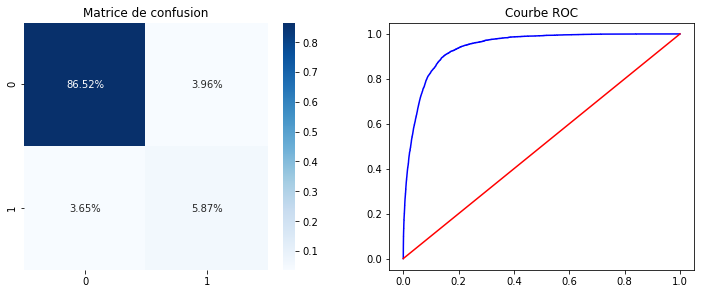

severe_toxic :
              Value
Metrics            
Accuracy   0.993842
Recall     0.408719
Precision  0.458716
F-Score    0.432277

AUC :  0.7029684042188133


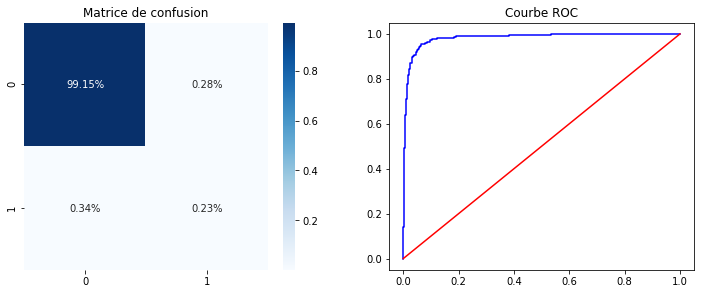

obscene :
              Value
Metrics            
Accuracy   0.960440
Recall     0.634245
Precision  0.664679
F-Score    0.649106

AUC :  0.8073279161646897


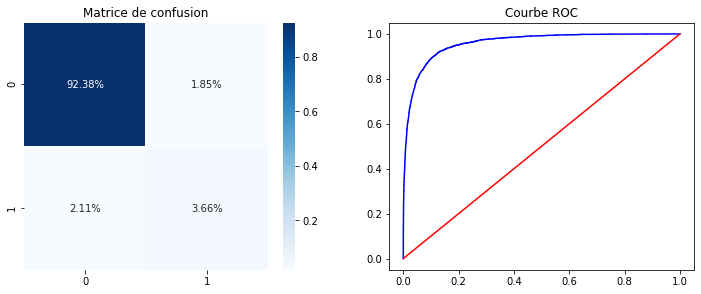

threat :
              Value
Metrics            
Accuracy   0.996546
Recall     0.037915
Precision  0.307692
F-Score    0.067511

AUC :  0.518816207137998


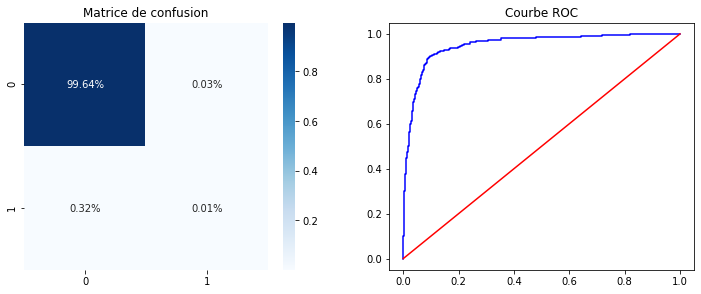

insult :
              Value
Metrics            
Accuracy   0.958533
Recall     0.447038
Precision  0.668996
F-Score    0.535945

AUC :  0.7172599264558491


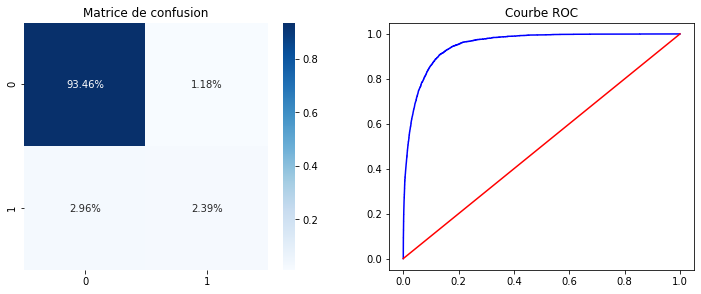

identity_hate :
              Value
Metrics            
Accuracy   0.988809
Recall     0.113764
Precision  0.487952
F-Score    0.184510

AUC :  0.5562102556461269


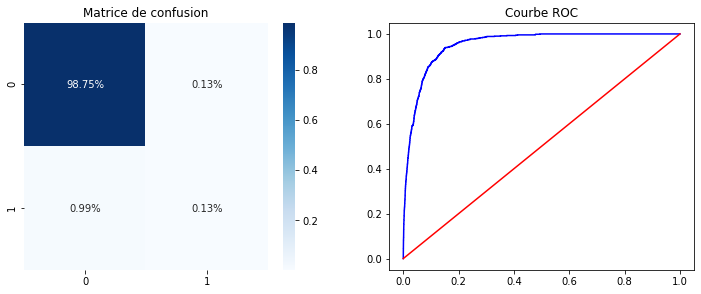

In [0]:
plot_metrics(y_pred_logreg_D2V, y_test, y_test.columns, 0.5)

L'utilisation de Doc2Vec au lieu de Word2Vec permet d'encore diminuer la loss. Or en regardant plus en détail les métriques telles que le F-Score, l'AUC ou le ROC, nous observons qu'il y a des classes de toxicité qui sont mieux prédites par une méthode ou l'autre. Toutefois, de manière générale nous pouvons confirmer que Doc2Vec est meilleur pour traiter notre problème de classification dans le cas la régression logistique.

#### <u>Choix de l'embedding</u>

Au vue des resultats obtenus précédemment, nous décidons de garder les embeddings de Doc2Vec afin d'obtenir la meilleure classification possible avec la régression logistique.

In [0]:
mean_loss_logreg = np.mean(logloss_logreg['Logloss test'])
mean_loss_logreg_TFIDF = np.mean(logloss_logreg_TFIDF['Logloss test'])
mean_loss_logreg_W2V = np.mean(logloss_logreg_W2V['Logloss test'])
mean_loss_logreg_D2V = np.mean(logloss_logreg_D2V['Logloss test'])

### **<u>IV.2 LGBM</u>**

<h5 align='justify'> Nous allons procéder comme précédemment afin de savoir quel est le meileur embedding à appliquer pour le modèle LGBM. </h5>

#### <u>Avec les features et sans embedding</u>

In [0]:
X_train = features_train.iloc[:,1:]
y_train = train.iloc[:,2:8]
X_test = features_test
y_test = test.iloc[:,2:8]

[importance_lgbm, logloss_lgbm, y_pred_lgbm] = classification(lgb.LGBMClassifier(), X_train, y_train, X_test, y_test)

In [0]:
logloss_lgbm

,Logloss train,Logloss test
Toxicity class,,
toxic,0.271759,0.280692
severe_toxic,0.035080,0.034829
obscene,0.174851,0.197722
threat,0.010286,0.024257
insult,0.165948,0.187248
identity_hate,0.035593,0.057354


toxic :
              Value
Metrics            
Accuracy   0.905186
Recall     0.109688
Precision  0.509146
F-Score    0.180492

AUC :  0.5492815411176194


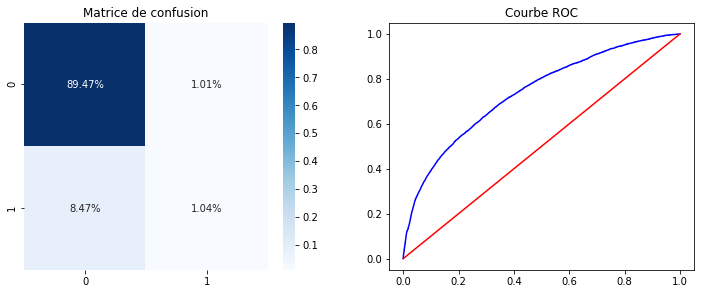

severe_toxic :
              Value
Metrics            
Accuracy   0.993154
Recall     0.038147
Precision  0.141414
F-Score    0.060086

AUC :  0.5184054460445185


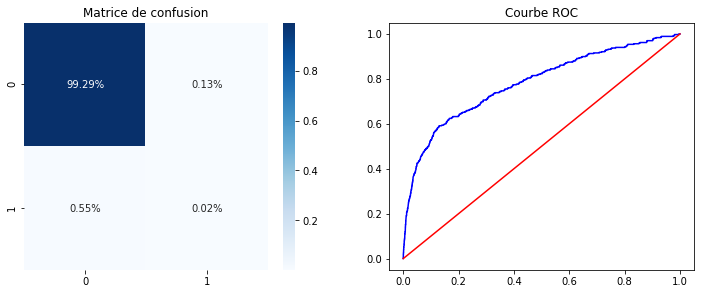

obscene :
              Value
Metrics            
Accuracy   0.940948
Recall     0.027364
Precision  0.349481
F-Score    0.050754

AUC :  0.5121227205636264


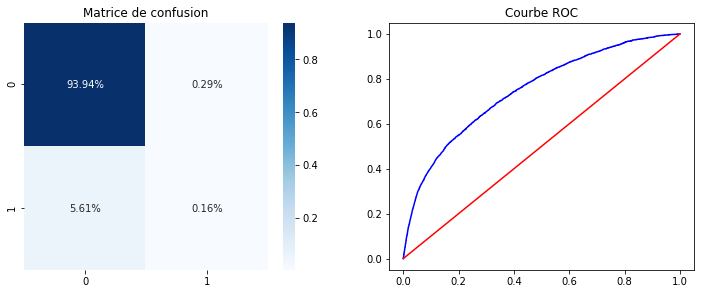

threat :
              Value
Metrics            
Accuracy   0.996311
Recall     0.009479
Precision  0.068966
F-Score    0.016667

AUC :  0.504527628242542


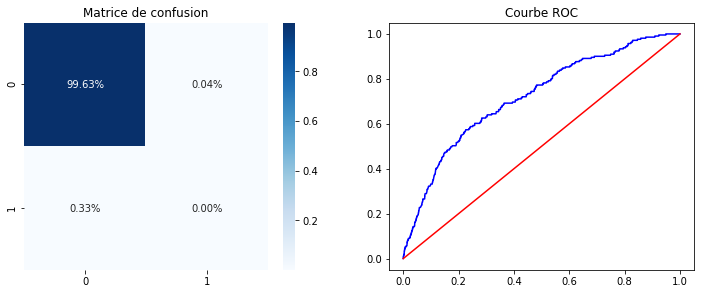

insult :
              Value
Metrics            
Accuracy   0.945747
Recall     0.017800
Precision  0.367470
F-Score    0.033955

AUC :  0.5080328747561236


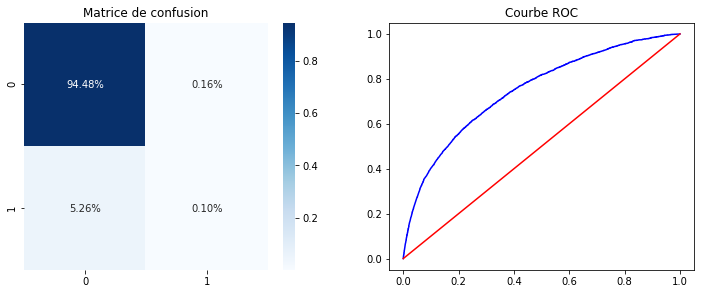

identity_hate :
              Value
Metrics            
Accuracy   0.988434
Recall     0.011236
Precision  0.181818
F-Score    0.021164

AUC :  0.5053334645195229


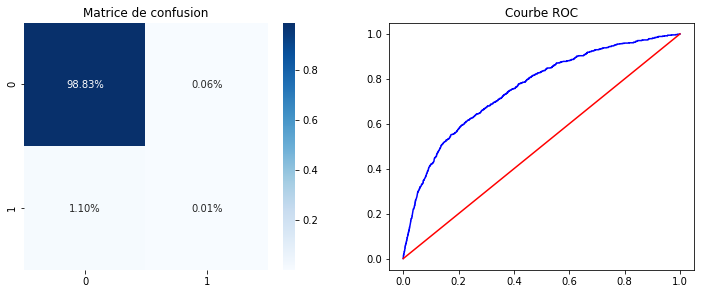

In [0]:
plot_metrics(y_pred_lgbm, y_test, y_test.columns, 0.5)

En comparant le LGBM à la régression logistique, sur les mêmes features on obtient une légère réduction de l'erreur. On s'attend donc à une erreur plus faible pour les différents embeddings également.

#### <u>Avec les features et TFIDF </u>

In [0]:
X_train = hstack((TFIDF_train, np.array(features_train.iloc[:,1:]))).tocsr()
y_train = train.iloc[:,2:8]
X_test = hstack((TFIDF_test, np.array(features_test))).tocsr()
y_test = test.iloc[:,2:8]

In [0]:
[importance_lgbm_TFIDF, logloss_lgbm_TFIDF, y_pred_lgbm_TFIDF] = classification(lgb.LGBMClassifier(), X_train, y_train, X_test, y_test)

In [0]:
logloss_lgbm_TFIDF

,Logloss train,Logloss test
Toxicity class,,
toxic,0.168496,0.230986
severe_toxic,0.017567,0.025651
obscene,0.083518,0.142909
threat,0.010897,0.084215
insult,0.100529,0.148481
identity_hate,0.021651,0.047639


toxic :
              Value
Metrics            
Accuracy   0.919488
Recall     0.409524
Precision  0.615955
F-Score    0.491962

AUC :  0.6913307964147516


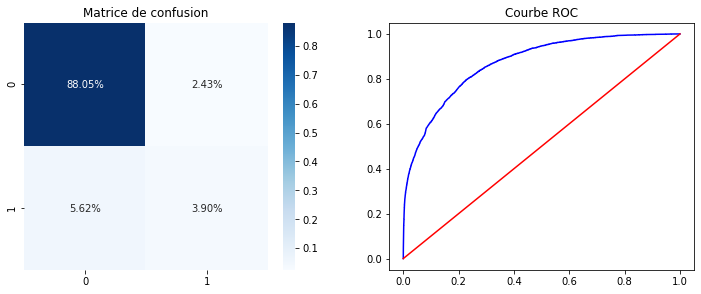

severe_toxic :
              Value
Metrics            
Accuracy   0.992404
Recall     0.228883
Precision  0.292683
F-Score    0.256881

AUC :  0.6128457809188229


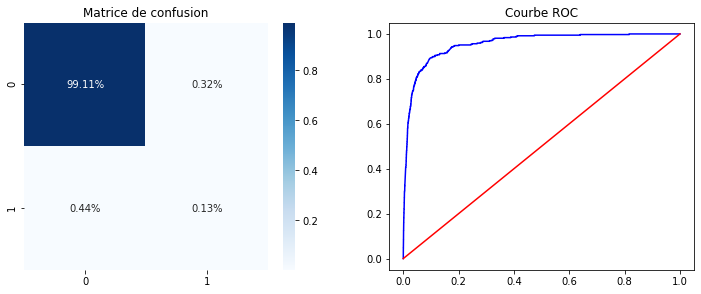

obscene :
              Value
Metrics            
Accuracy   0.955266
Recall     0.479545
Precision  0.652896
F-Score    0.552952

AUC :  0.731968083472052


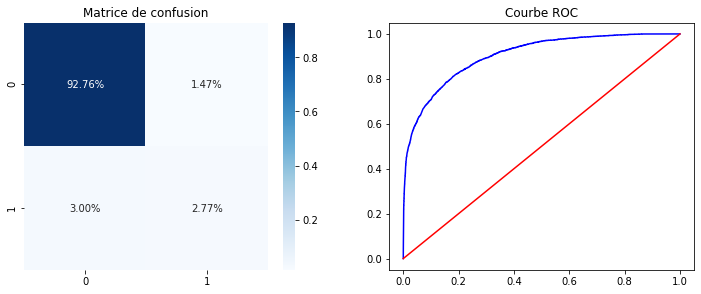

threat :
              Value
Metrics            
Accuracy   0.993201
Recall     0.109005
Precision  0.085185
F-Score    0.095634

AUC :  0.5525656312298691


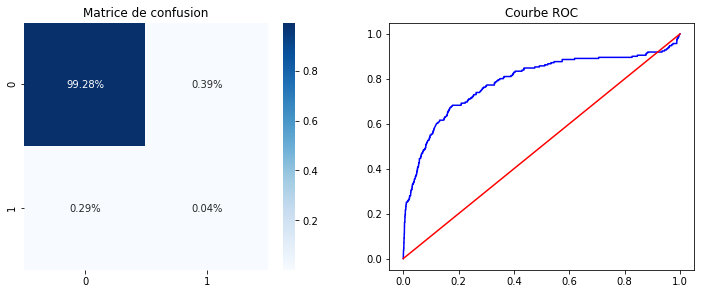

insult :
              Value
Metrics            
Accuracy   0.950467
Recall     0.350160
Precision  0.560224
F-Score    0.430957

AUC :  0.66730167828438


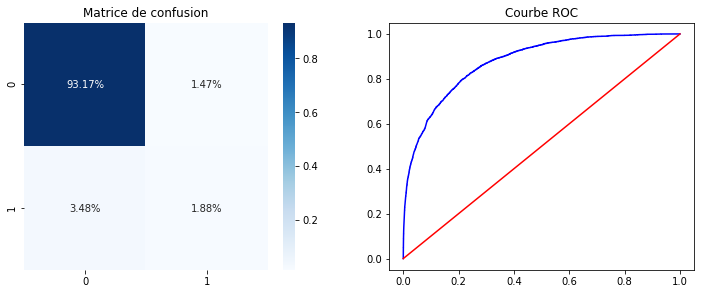

identity_hate :
              Value
Metrics            
Accuracy   0.988684
Recall     0.105337
Precision  0.462963
F-Score    0.171625

AUC :  0.5519809662218057


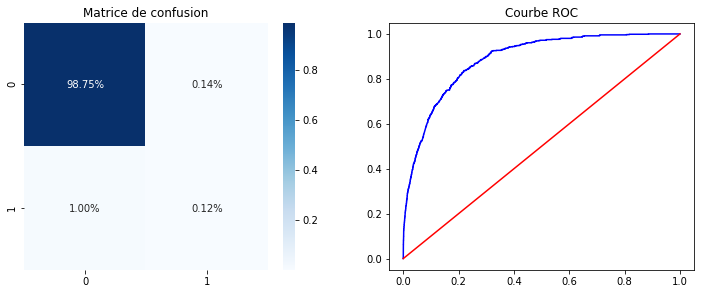

In [0]:
plot_metrics(y_pred_lgbm_TFIDF, y_test, y_test.columns, 0.5)

#### <u>Avec les features et Word2Vec </u>

In [0]:
X_train = np.concatenate((np.array(Word2Vec_train), features_train.iloc[:,1:]), axis = 1)
y_train = train.iloc[:,2:8]
X_test = np.concatenate((Word2Vec_test, features_test), axis = 1)
y_test = test.iloc[:,2:8]

In [0]:
%%time

[importance_lgbm_W2V, logloss_lgbm_W2V, y_pred_lgbm_W2V] = classification(lgb.LGBMClassifier(), X_train, y_train, X_test, y_test)

CPU times: user 6min 42s, sys: 1.72 s, total: 6min 44s
Wall time: 1min 57s


In [0]:
logloss_lgbm_W2V

,Logloss train,Logloss test
Toxicity class,,
toxic,0.099843,0.174986
severe_toxic,0.006340,0.026070
obscene,0.042984,0.105433
threat,0.052569,0.221299
insult,0.053991,0.108515
identity_hate,0.005386,0.044231


toxic :
              Value
Metrics            
Accuracy   0.930445
Recall     0.684893
Precision  0.622352
F-Score    0.652126

AUC :  0.8205854536158834


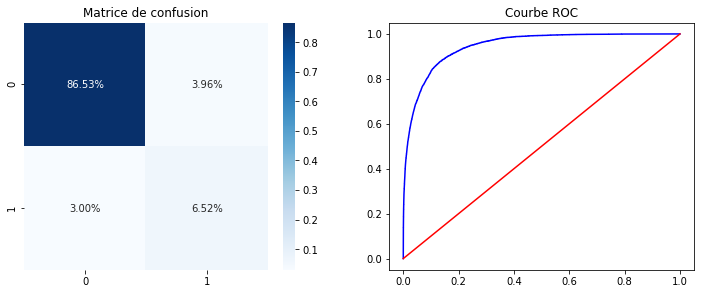

severe_toxic :
              Value
Metrics            
Accuracy   0.990106
Recall     0.329700
Precision  0.238189
F-Score    0.276571

AUC :  0.6618082095289931


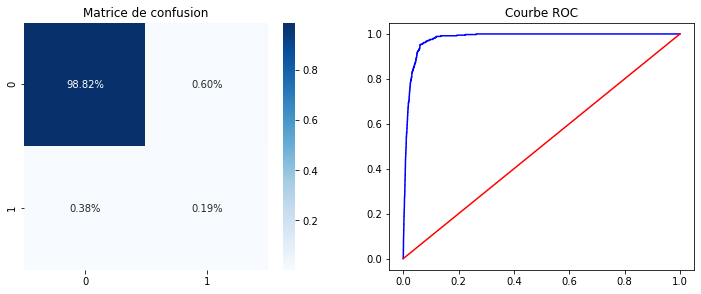

obscene :
              Value
Metrics            
Accuracy   0.962315
Recall     0.623679
Precision  0.692539
F-Score    0.656308

AUC :  0.8033634873146767


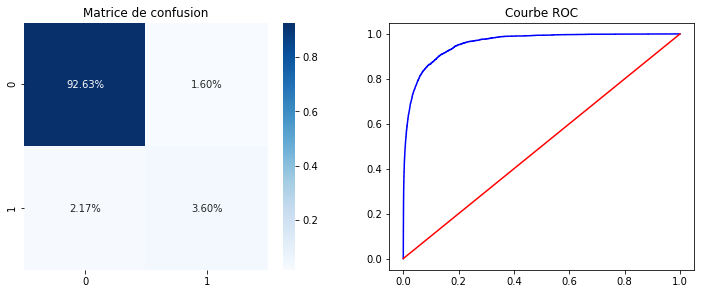

threat :
              Value
Metrics            
Accuracy   0.987949
Recall     0.218009
Precision  0.070552
F-Score    0.106605

AUC :  0.6042530652731058


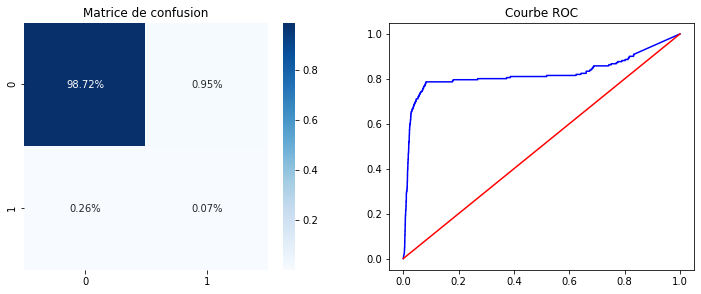

insult :
              Value
Metrics            
Accuracy   0.959752
Recall     0.555880
Precision  0.644016
F-Score    0.596711

AUC :  0.7692447395724846


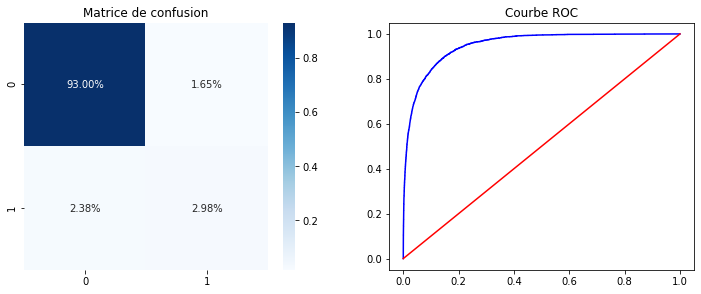

identity_hate :
              Value
Metrics            
Accuracy   0.987558
Recall     0.294944
Precision  0.416667
F-Score    0.345395

AUC :  0.6451483872090624


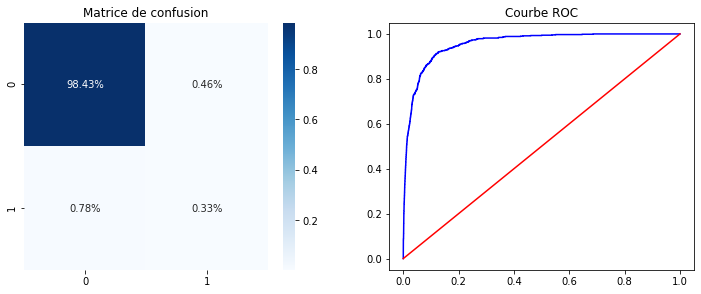

In [0]:
plot_metrics(y_pred_lgbm_W2V, y_test, y_test.columns, 0.5)

#### <u>Avec les features et Doc2Vec </u>

In [0]:
X_train = np.concatenate((Doc2Vec_train, features_train.iloc[:,1:]), axis = 1)
y_train = train.iloc[:,2:8]
X_test = np.concatenate((Doc2Vec_test, features_test), axis = 1)
y_test = test.iloc[:,2:8]

In [0]:
%%time

[importance_lgbm_D2V, logloss_lgbm_D2V, y_pred_lgbm_D2V] = classification(lgb.LGBMClassifier(), X_train, y_train, X_test, y_test)

CPU times: user 7min 4s, sys: 1.46 s, total: 7min 5s
Wall time: 2min 1s


In [0]:
logloss_lgbm_D2V

,Logloss train,Logloss test
Toxicity class,,
toxic,0.095882,0.172718
severe_toxic,0.005200,0.028477
obscene,0.042231,0.104150
threat,0.038133,0.166610
insult,0.051942,0.109712
identity_hate,0.004413,0.047413


toxic :
              Value
Metrics            
Accuracy   0.929132
Recall     0.629721
Precision  0.627249
F-Score    0.628482

AUC :  0.7951758636347546


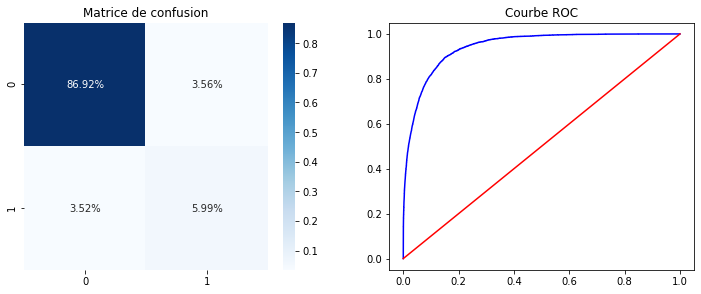

severe_toxic :
              Value
Metrics            
Accuracy   0.990887
Recall     0.313351
Precision  0.257848
F-Score    0.282903

AUC :  0.6540739980493666


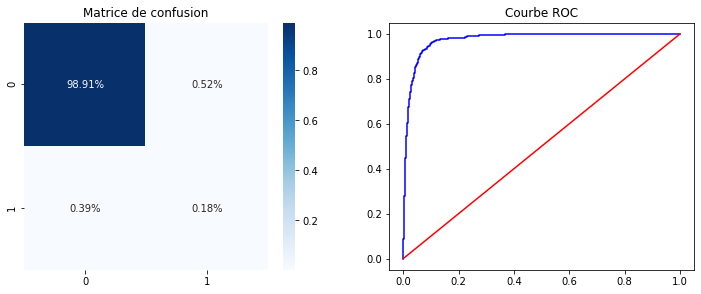

obscene :
              Value
Metrics            
Accuracy   0.962143
Recall     0.578705
Precision  0.711289
F-Score    0.638183

AUC :  0.7821618740632751


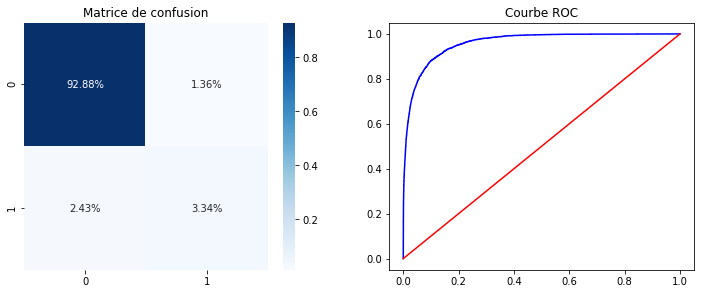

threat :
              Value
Metrics            
Accuracy   0.990012
Recall     0.127962
Precision  0.056017
F-Score    0.077922

AUC :  0.5604133665833335


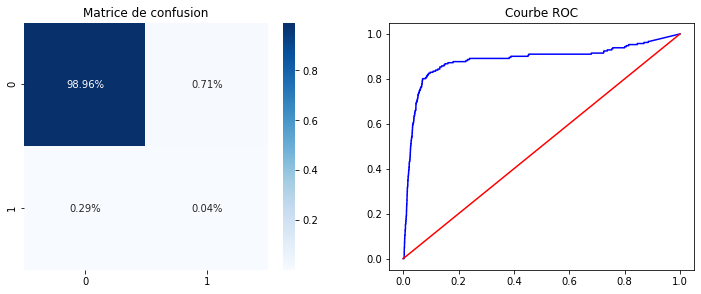

insult :
              Value
Metrics            
Accuracy   0.959189
Recall     0.494018
Precision  0.658755
F-Score    0.564616

AUC :  0.7397672166108342


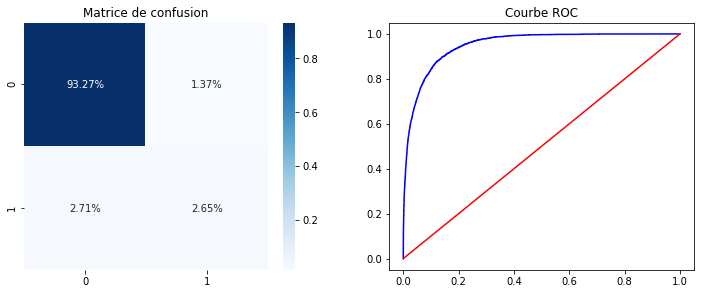

identity_hate :
              Value
Metrics            
Accuracy   0.987308
Recall     0.214888
Precision  0.376847
F-Score    0.273703

AUC :  0.6054443260256231


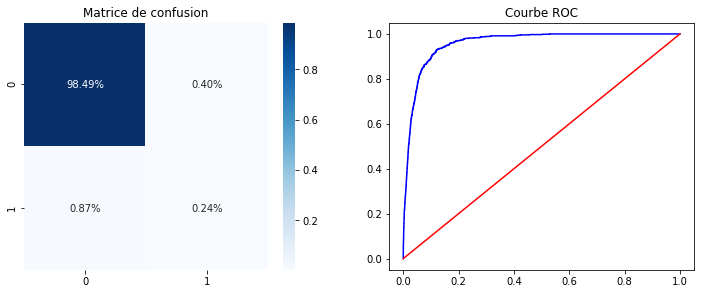

In [0]:
plot_metrics(y_pred_lgbm_D2V, y_test, y_test.columns, 0.5)

#### <u>Choix de l'embedding</u>

Nous observons que les résultats entre Word2Vec et Doc2Vec sont assez similaires dans ce cas là. Word2Vec réussi à prédire mieux certaines classes de toxicité que d'autres que Doc2Vec et inversement. 

De manière arbitraire nous sélectionnons également Doc2Vec pour le modèle LGBM.




In [0]:
mean_loss_lgbm = np.mean(logloss_lgbm['Logloss test'])
mean_loss_lgbm_TFIDF = np.mean(logloss_lgbm_TFIDF['Logloss test'])
mean_loss_lgbm_W2V = np.mean(logloss_lgbm_W2V['Logloss test'])
mean_loss_lgbm_D2V = np.mean(logloss_lgbm_D2V['Logloss test'])

### **<u>IV.3 LSTM Bidirectionnel </u>**

<h5 align='justify'>Le dernier modèle que nous avons décidé d'implémenter est le LSTM bidirectionnel. Contrairement aux modèles précédents, un LSTM permet de conserver le contexte passé du corpus.

Un LSTM classique préserve l'information des inputs qui sont passés au travers de ses états cachés.

Un LSTM unidirectionnel ne conserve que les informations du passé car les seules inputs sont celles qu'il a observé dans le passé.

Enfin un LSTM bidirectionnel exécute les inputs de deux manières : une du passé au futur et une du futur au passé. Ce qui le diffère de l'approche unidirectionnelle est lorsque le LSTM s'exécute en "backward", le modèle bidirectionnel préserve l'information future et utilise les deux états cachés (passé et futur) combinés afin de préserver les informations présentes et futures. Techniquement parlant, un LSTM bidirectionnel est composé de deux réseaux de neurones contrairement à un LSTM classique qui n'en possède qu'un seul. Le premier réseau de neurones à accès aux informations passées de manière forward et l'autre à accès aux informations futures de manière dans le sens inverse.

Les réseaux LSTM bidirectionnel montrent de très bons résultats comparé à un LSTM classique car ils permettent de mieux comprendre le contexte d'une phrase. </h5>



#### <u> Preprocessing data to Keras format </u>

In [0]:
flattened_list_train = [val for sublist in list_train for val in sublist]
vocab = Counter(flattened_list_train)
word_vectors = Word2VecModel.wv

In [0]:
MAX_NB_WORDS = len(word_vectors.vocab)
MAX_SEQUENCE_LENGTH = 200

word_index = {t[0]: i+1 for i,t in enumerate(vocab.most_common(MAX_NB_WORDS))}
train_sequences = [[word_index.get(t, 0) for t in comment] for comment in list_train]
test_sequences = [[word_index.get(t, 0)  for t in comment] for comment in list_test]

train_data = pad_sequences(train_sequences, maxlen = MAX_SEQUENCE_LENGTH, padding = "pre", truncating = "post")
test_data = pad_sequences(test_sequences, maxlen = MAX_SEQUENCE_LENGTH, padding = "pre", truncating = "post")
list_classes = ["toxic", "severe_toxic", "obscene", "threat", "insult", "identity_hate"]
y_train = train[list_classes].values

print('Shape of training data set tensor:', train_data.shape)
print('Shape of testing data set tensor:', test_data.shape)
print('Shape of label tensor:', y_train.shape)

Shape of training data set tensor: (159571, 200)
Shape of testing data set tensor: (63978, 200)
Shape of label tensor: (159571, 6)


#### <u> Embedding matrix </u>

In [0]:
WV_DIM = 300
nb_words = min(MAX_NB_WORDS, len(word_vectors.vocab))
wv_matrix = np.zeros((nb_words, WV_DIM))
for word, i in word_index.items():
    if i-1 >= MAX_NB_WORDS:
        continue
    try:
        wv_matrix[i-1] = word_vectors[word]
    except:
        pass

#### <u> LSTM bidirectionnel avec CUDA </u>

In [0]:
embedding_layer = Embedding(nb_words, WV_DIM, mask_zero=False, weights=[wv_matrix], input_length=MAX_SEQUENCE_LENGTH, trainable=False)

comment_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')
embedded_sequences = embedding_layer(comment_input)

embedded_sequences = SpatialDropout1D(0.2)(embedded_sequences)
x = Bidirectional(CuDNNLSTM(64, return_sequences=False))(embedded_sequences)

x = Dropout(0.2)(x)
x = BatchNormalization()(x)
preds = Dense(6, activation='sigmoid')(x)

BiLSTM = Model(inputs=[comment_input], outputs=preds)
BiLSTM.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.001, clipnorm=.25, beta_1=0.7, beta_2=0.99), metrics=[])

BiLSTM_hist = BiLSTM.fit([train_data], y_train, validation_split=0.1, epochs=15, batch_size=256, shuffle=True)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Train on 143613 samples, validate on 15958 samples
Epoch 1/15
143613/143613 [==============================] - 28s 194us/step - loss: 0.1941 - val_loss: 0.0930
Epoch 2/15
143613/143613 [==============================] - 22s 152us/step - loss: 0.0833 - val_loss: 0.0752
Epoch 3/15
143613/143613 [==============================] - 22s 152us/step - loss: 0.0729 - val_loss: 0.0732
Epoch 4/15
143613/143613 [==============================] - 22s 153us/step - loss: 0.0667 - val_loss: 0.0641
Epoch 5/15
143613/143613 [==============================] - 22s 152us/step - loss: 0.0633 - val_loss: 0.0659
Epoch 6/15
143613/143613 [==============================] - 22s 152us/step - loss: 0.0604 - val_loss: 0.0642
Epoch 7/15
143613/143613 [==============================] - 22s 152us/step - loss: 0.0582 - val_loss: 0.0599
Epoch 8/15

#### <u> Overfitting </u>

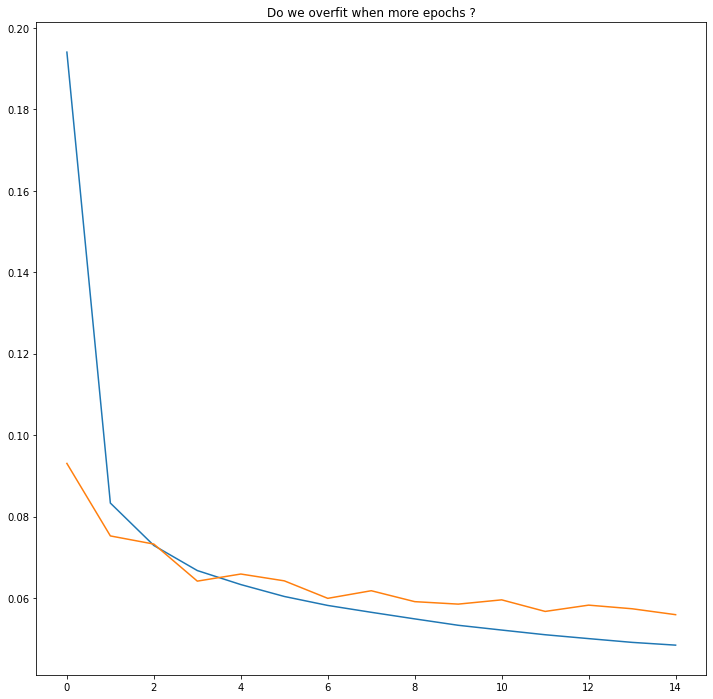

In [0]:
df = pd.DataFrame(BiLSTM_hist.history)
plt.figure(figsize=(12,12))
plt.plot(df["loss"])
plt.plot(df["val_loss"])
plt.title("Do we overfit when more epochs ?")
plt.show()

L'implémentation d'un LSTM nous permet également de séparer le training data set en une portion de validation data set afin de savoir si nous overfittons au fur et à mesure des epochs. Nous voyons grâce au graphique précédent que ce n'est pas le cas. Bonne nouvelle !

#### <u> Calcul de la log loss </u>

In [0]:
y_test = test.iloc[:,2:8]
y_train = train.iloc[:,2:8]
preds_train_class = BiLSTM.predict(train_data)
preds_test_class = BiLSTM.predict(test_data)
df_preds_train_class = pd.DataFrame(preds_train_class)
df_preds_test_class = pd.DataFrame(preds_test_class)

In [0]:
train_loss = []
test_loss = []

for i, j in enumerate(y_train.columns):
    train_loss_class = log_loss(y_train[j], df_preds_train_class[i])
    test_loss_class = log_loss(y_test[j], df_preds_test_class[i])
    train_loss.append(train_loss_class)
    test_loss.append(test_loss_class)
    
df_loss_BILSTM = pd.DataFrame({'Toxicity class': y_train.columns, 'Logloss train': train_loss, 'Logloss test': test_loss}).set_index('Toxicity class')

In [0]:
df_loss_BILSTM

,Logloss train,Logloss test
Toxicity class,,
toxic,0.097576,0.182178
severe_toxic,0.020656,0.021201
obscene,0.045419,0.101758
threat,0.009011,0.012210
insult,0.061309,0.103709
identity_hate,0.021827,0.030828


La log loss sur le testing data set est plus faible que sur les modèles précédents : régression logistique et LGBM, cela nous conforte dans l'idée qu'un BILSTM est le plus optimal pour notre problème. Nous observons également qu'il y a moins d'overfitting sur le training data set que dans les modèles précédents.

In [0]:
mean_loss_BILSTM_W2V = np.mean(df_loss_BILSTM['Logloss test'])

#### <u> Calcul des métriques </u>

toxic :
              Value
Metrics            
Accuracy   0.927350
Recall     0.761576
Precision  0.592035
F-Score    0.666188

AUC :  0.8531831469363637


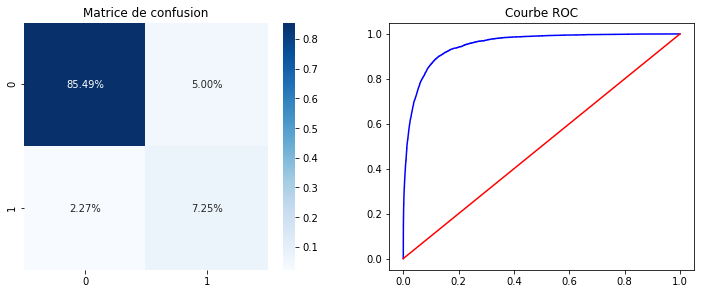

severe_toxic :
              Value
Metrics            
Accuracy   0.993060
Recall     0.272480
Precision  0.361011
F-Score    0.310559

AUC :  0.6348485132106391


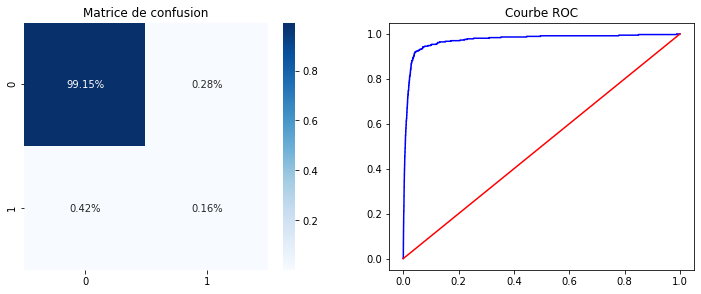

obscene :
              Value
Metrics            
Accuracy   0.962065
Recall     0.724736
Precision  0.654674
F-Score    0.687926

AUC :  0.8506655649136294


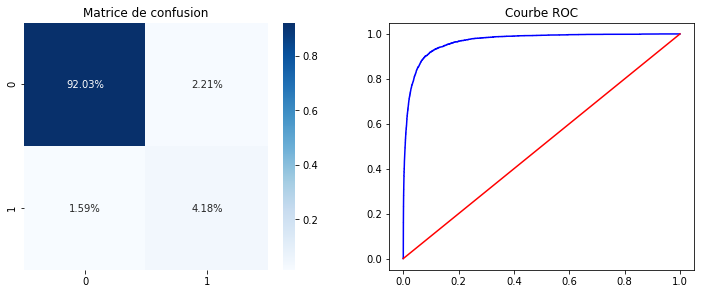

threat :
              Value
Metrics            
Accuracy   0.996546
Recall     0.118483
Precision  0.416667
F-Score    0.184502

AUC :  0.5589672695403148


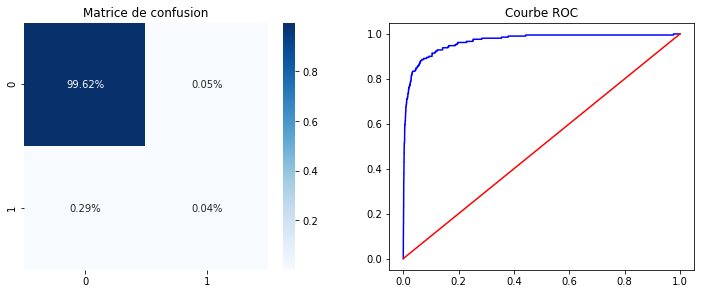

insult :
              Value
Metrics            
Accuracy   0.958861
Recall     0.646922
Precision  0.609233
F-Score    0.627512

AUC :  0.8117185850856444


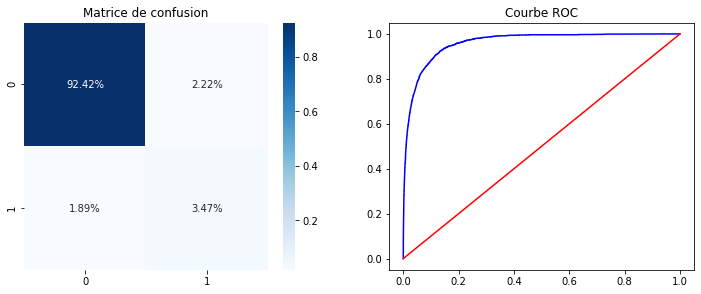

identity_hate :
              Value
Metrics            
Accuracy   0.990512
Recall     0.248596
Precision  0.710843
F-Score    0.368366

AUC :  0.6237287267918549


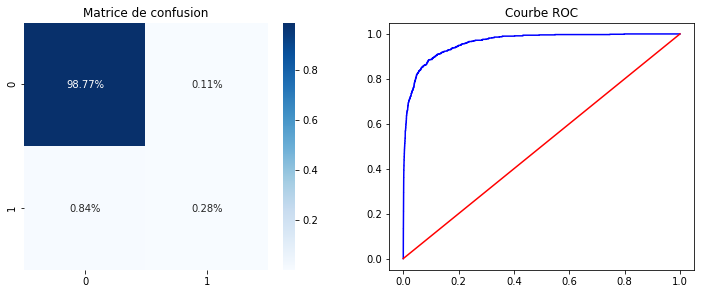

In [0]:
plot_metrics(df_preds_test_class.transpose().values, y_test, y_test.columns, 0.5)

### **<u>IV.4 Conclusion</u>**

In [0]:
df = pd.DataFrame({'Modele':['Regression logistique', 'LightGBM', 'Bidirectional LSTM'], 'Sans embedding':[mean_loss_logreg, mean_loss_lgbm, 'NaN'],
                   'TFIDF':[mean_loss_logreg_TFIDF, mean_loss_lgbm_TFIDF, 'NaN'], 'Word2Vec':[mean_loss_logreg_W2V, mean_loss_lgbm_W2V, mean_loss_BILSTM_W2V],
                   'Doc2Vec':[mean_loss_logreg_D2V, mean_loss_lgbm_D2V, 'NaN']}).set_index('Modele')

In [0]:
df

,Sans embedding,TFIDF,Word2Vec,Doc2Vec
Modele,,,,
Regression logistique,0.133352,0.107077,0.093664,0.0792287
LightGBM,0.13035,0.113314,0.113422,0.104847
Bidirectional LSTM,NaN,NaN,0.075314,NaN


<h5 align='justify'> Nous observons que c'est le LSTM bidirectionnel qui donne les meilleurs résultats et cela n'est pas étonnant étant donné son architecture. 

Nous aurons pu par la suite fine tuner ce modèle mais par manque de temps et de puissance de calcul nous ne le ferons pas ici. </h5>